# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

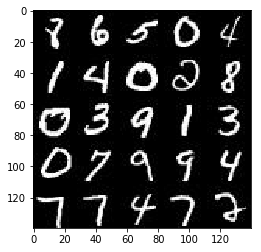

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

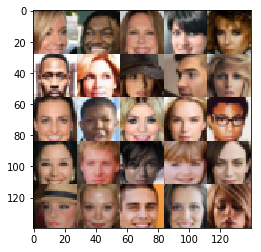

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.6.0


/usr/local/lib/python3.6/site-packages/ipykernel_launcher.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.
  


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_real = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name = "input_real")
    input_fake = tf.placeholder(tf.float32, (None, z_dim), name = "input_fake")
    lr = tf.placeholder(tf.float32, name="learning_rate")
    
    return input_real, input_fake, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [34]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    dropout = 0.9

    alpha = 0.1
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        conv_output_1 = tf.layers.conv2d(images, filters=64, kernel_size=5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_output_1 = tf.maximum(alpha*conv_output_1, conv_output_1)
        conv_output_1 = tf.nn.dropout(conv_output_1, dropout)
        #14*14*64

        conv_output_2 = tf.layers.conv2d(conv_output_1, filters=128, kernel_size=5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_output_2 = tf.layers.batch_normalization(conv_output_2, training=True)
        conv_output_2 = tf.maximum(alpha*conv_output_2, conv_output_2)
        conv_output_2 = tf.nn.dropout(conv_output_2, dropout)
        #7*7*128

        conv_output_3 = tf.layers.conv2d(conv_output_2, filters=256, kernel_size=5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_output_3 = tf.layers.batch_normalization(conv_output_3, training=True)
        conv_output_3 = tf.maximum(alpha*conv_output_3, conv_output_3)
        conv_output_3 = tf.nn.dropout(conv_output_3, dropout)
        #4*4*256
        
        flat_layer = tf.reshape(conv_output_3, [-1, 4*4*256])
        logits = tf.layers.dense(flat_layer, 1)

        out = tf.nn.sigmoid(logits)

        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [35]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    reuse = not is_train
    dropout = 0.5
    
    alpha = 0.1
    
    with tf.variable_scope('generator', reuse = reuse):
        
#         dense_output = tf.layers.dense(z, units = 7*7*512, activation=None)
#         dense_output_reshaped = tf.reshape(dense_output, (-1, 7, 7, 512))
#         dense_output_reshaped = tf.layers.batch_normalization(dense_output_reshaped, training=is_train)
#         dense_output_reshaped = tf.maximum(alpha*dense_output_reshaped, dense_output_reshaped)
#         dense_output_reshaped = tf.nn.dropout(dense_output_reshaped, dropout)
#         #7*7*512
        
#         conv_layer_1 = tf.layers.conv2d_transpose(dense_output_reshaped, filters=256, kernel_size=5, strides=2, padding="same")
#         conv_layer_1 = tf.layers.batch_normalization(conv_layer_1, training=is_train)
#         conv_layer_1 = tf.maximum(alpha*conv_layer_1, conv_layer_1)
#         conv_layer_1 = tf.nn.dropout(conv_layer_1, dropout)
#         #14*14*256

#         conv_layer_2 = tf.layers.conv2d_transpose(conv_layer_1, filters=128, kernel_size=5, strides=2, padding="same")
#         conv_layer_2 = tf.layers.batch_normalization(conv_layer_2, training=is_train)
#         conv_layer_2 = tf.maximum(alpha*conv_layer_2, conv_layer_2)
#         conv_layer_2 = tf.nn.dropout(conv_layer_2, dropout)
#         #28*28*128

#         conv_layer_3 = tf.layers.conv2d_transpose(conv_layer_2, filters=64, kernel_size=5, strides=2, padding="same")
#         conv_layer_3 = tf.layers.batch_normalization(conv_layer_3, training=is_train)
#         conv_layer_3 = tf.maximum(alpha*conv_layer_3, conv_layer_3)
#         conv_layer_3 = tf.nn.dropout(conv_layer_3, dropout)
#         #56*56*64

#         conv_layer_4 = tf.layers.conv2d_transpose(conv_layer_3, filters=32, kernel_size=5, strides=2, padding="same")
#         conv_layer_4 = tf.layers.batch_normalization(conv_layer_4, training=is_train)
#         conv_layer_4 = tf.maximum(alpha*conv_layer_4, conv_layer_4)
#         conv_layer_4 = tf.nn.dropout(conv_layer_4, dropout)
#         #128*128*32

#         conv_layer_5 = tf.layers.conv2d_transpose(conv_layer_4, filters=out_channel_dim, kernel_size=5, strides=2, padding="same")
# #         conv_layer_4 = tf.layers.batch_normalization(conv_layer_4, training=is_train)
# #         conv_layer_4 = tf.maximum(alpha*conv_layer_4, conv_layer_4)
# #         conv_layer_4 = tf.nn.dropout(conv_layer_4, 0.5)
#         #256*256*3

        dense_output = tf.layers.dense(z, units = 4*4*256, activation=None)
        dense_output_reshaped = tf.reshape(dense_output, (-1, 4, 4, 256))
        dense_output_reshaped = tf.layers.batch_normalization(dense_output_reshaped, training=is_train)
        dense_output_reshaped = tf.maximum(alpha*dense_output_reshaped, dense_output_reshaped)
#         dense_output_reshaped = tf.nn.dropout(dense_output_reshaped, dropout)
        #4*4*256
        
        conv_layer_1 = tf.layers.conv2d_transpose(dense_output_reshaped, filters=128, kernel_size=5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer_1 = tf.layers.batch_normalization(conv_layer_1, training=is_train)
        conv_layer_1 = tf.maximum(alpha*conv_layer_1, conv_layer_1)
#         conv_layer_1 = tf.nn.dropout(conv_layer_1, dropout)
        #8*8*128

        conv_layer_2 = tf.layers.conv2d_transpose(conv_layer_1, filters=64, kernel_size=5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer_2 = tf.layers.batch_normalization(conv_layer_2, training=is_train)
        conv_layer_2 = tf.maximum(alpha*conv_layer_2, conv_layer_2)
#         conv_layer_2 = tf.nn.dropout(conv_layer_2, dropout)
        #16*16*64

        conv_layer_3 = tf.layers.conv2d_transpose(conv_layer_2, filters=32, kernel_size=5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
        conv_layer_3 = tf.layers.batch_normalization(conv_layer_3, training=is_train)
        conv_layer_3 = tf.maximum(alpha*conv_layer_3, conv_layer_3)
        conv_layer_3 = tf.nn.dropout(conv_layer_2, dropout)
        #32*32*32

        conv_layer_4 = tf.layers.conv2d_transpose(conv_layer_3, filters=out_channel_dim, kernel_size=5, strides=2, padding="same", kernel_initializer=tf.contrib.layers.xavier_initializer())
#         conv_layer_4 = tf.layers.batch_normalization(conv_layer_4, training=is_train)
#         conv_layer_4 = tf.maximum(alpha*conv_layer_4, conv_layer_4)
#         conv_layer_4 = tf.nn.dropout(conv_layer_4, dropout)
        #64*64*3

        correct_image_size = (28, 28)
        logits = tf.image.resize_images(conv_layer_4, correct_image_size)
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [29]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    gen_output = generator(input_z, out_channel_dim, is_train=True)
    
    real_disc_out, real_disc_logits = discriminator(input_real, reuse = False)
    fake_disc_out, fake_disc_logits = discriminator(gen_output, reuse = True)
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=fake_disc_logits, labels=tf.ones_like(fake_disc_out)))
    
    smooth = 0.1
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=real_disc_logits, labels=tf.ones_like(real_disc_out)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=fake_disc_logits, labels=tf.zeros_like(fake_disc_out)))
    
    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [28]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    all_vars = tf.trainable_variables()
    gen_vars = [var for var in all_vars if "generator" in var.name]
    disc_vars = [var for var in all_vars if "discriminator" in var.name]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list = disc_vars)
        g_train_optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list = gen_vars)
    
    return d_train_optimizer, g_train_optimizer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [21]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    input_real, input_fake, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)   
    d_loss, g_loss = model_loss(input_real, input_fake, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    iter_count = 0
    print_every = 10
    show_every = 100
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):

                iter_count += 1
                
                batch_z = np.random.uniform(low = -1, high = 1, size=(batch_size, z_dim))
                batch_images = batch_images*2
                
                _ = sess.run(d_opt, feed_dict = {input_real: batch_images, input_fake: batch_z, lr: learning_rate})
                _ = sess.run(g_opt, feed_dict = {input_fake: batch_z, input_real: batch_images, lr: learning_rate})
                
                if iter_count%print_every == 0:
                    
                    train_loss_d = d_loss.eval({input_fake: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_fake: batch_z})

                    print("Iter {}...".format(iter_count+1),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if iter_count%show_every == 0:
                    show_generator_output(sess, 25, input_fake, data_shape[3], data_image_mode)
                    

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Iter 11... Discriminator Loss: 0.1052... Generator Loss: 2.6927


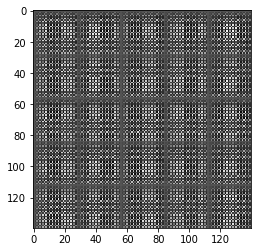

KeyboardInterrupt: 

In [13]:
batch_size = 32
z_dim = 1000
learning_rate = 0.0005
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Iter 11... Discriminator Loss: 1.5059... Generator Loss: 13.2520
Iter 21... Discriminator Loss: 2.6535... Generator Loss: 13.2350
Iter 31... Discriminator Loss: 1.2662... Generator Loss: 1.2915
Iter 41... Discriminator Loss: 3.4842... Generator Loss: 0.1413
Iter 51... Discriminator Loss: 1.5509... Generator Loss: 0.4755
Iter 61... Discriminator Loss: 1.0249... Generator Loss: 1.3568
Iter 71... Discriminator Loss: 0.9008... Generator Loss: 1.3343
Iter 81... Discriminator Loss: 0.8721... Generator Loss: 4.3445
Iter 91... Discriminator Loss: 1.2689... Generator Loss: 0.4954
Iter 101... Discriminator Loss: 1.0879... Generator Loss: 0.7002


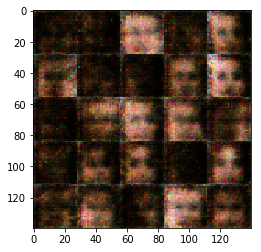

Iter 111... Discriminator Loss: 0.8213... Generator Loss: 1.2277
Iter 121... Discriminator Loss: 1.3288... Generator Loss: 0.4980
Iter 131... Discriminator Loss: 2.0547... Generator Loss: 0.2581
Iter 141... Discriminator Loss: 0.8372... Generator Loss: 2.3501
Iter 151... Discriminator Loss: 1.1065... Generator Loss: 0.8241
Iter 161... Discriminator Loss: 3.0949... Generator Loss: 0.0966
Iter 171... Discriminator Loss: 0.8903... Generator Loss: 1.5602
Iter 181... Discriminator Loss: 0.7149... Generator Loss: 1.4727
Iter 191... Discriminator Loss: 1.0917... Generator Loss: 0.8889
Iter 201... Discriminator Loss: 0.8587... Generator Loss: 1.2088


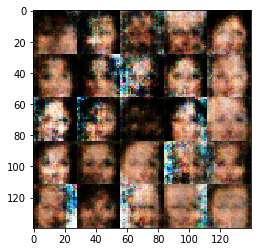

Iter 211... Discriminator Loss: 1.1297... Generator Loss: 0.7725
Iter 221... Discriminator Loss: 1.7230... Generator Loss: 0.4137
Iter 231... Discriminator Loss: 0.9903... Generator Loss: 1.6944
Iter 241... Discriminator Loss: 2.5987... Generator Loss: 2.9652
Iter 251... Discriminator Loss: 0.9472... Generator Loss: 0.9978
Iter 261... Discriminator Loss: 1.2058... Generator Loss: 0.8889
Iter 271... Discriminator Loss: 1.0911... Generator Loss: 1.2273
Iter 281... Discriminator Loss: 0.8195... Generator Loss: 1.6543
Iter 291... Discriminator Loss: 1.0070... Generator Loss: 1.8497
Iter 301... Discriminator Loss: 2.6394... Generator Loss: 0.1346


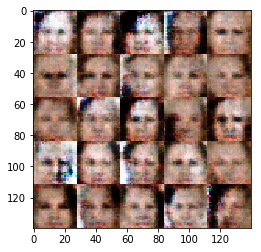

Iter 311... Discriminator Loss: 1.2046... Generator Loss: 0.6383
Iter 321... Discriminator Loss: 1.0208... Generator Loss: 0.9025
Iter 331... Discriminator Loss: 0.8263... Generator Loss: 1.5156
Iter 341... Discriminator Loss: 1.0353... Generator Loss: 1.8504
Iter 351... Discriminator Loss: 0.9382... Generator Loss: 0.8998
Iter 361... Discriminator Loss: 2.1107... Generator Loss: 0.2887
Iter 371... Discriminator Loss: 1.8420... Generator Loss: 0.3964
Iter 381... Discriminator Loss: 1.7304... Generator Loss: 0.3519
Iter 391... Discriminator Loss: 0.8953... Generator Loss: 1.2099
Iter 401... Discriminator Loss: 0.8447... Generator Loss: 1.0711


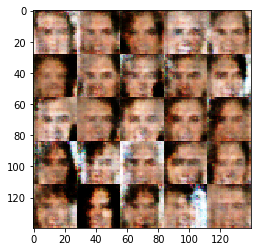

Iter 411... Discriminator Loss: 1.4002... Generator Loss: 0.4448
Iter 421... Discriminator Loss: 1.9789... Generator Loss: 4.1175
Iter 431... Discriminator Loss: 1.3930... Generator Loss: 0.8619
Iter 441... Discriminator Loss: 1.4016... Generator Loss: 0.6780
Iter 451... Discriminator Loss: 1.0097... Generator Loss: 1.3616
Iter 461... Discriminator Loss: 1.2724... Generator Loss: 0.6964
Iter 471... Discriminator Loss: 1.8868... Generator Loss: 0.4127
Iter 481... Discriminator Loss: 1.5107... Generator Loss: 0.7153
Iter 491... Discriminator Loss: 0.7633... Generator Loss: 1.3876
Iter 501... Discriminator Loss: 1.0984... Generator Loss: 1.6651


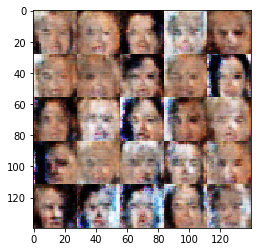

Iter 511... Discriminator Loss: 1.3465... Generator Loss: 0.4871
Iter 521... Discriminator Loss: 0.9457... Generator Loss: 1.1964
Iter 531... Discriminator Loss: 1.2313... Generator Loss: 1.0649
Iter 541... Discriminator Loss: 1.2916... Generator Loss: 1.6429
Iter 551... Discriminator Loss: 1.5189... Generator Loss: 0.3477
Iter 561... Discriminator Loss: 0.7924... Generator Loss: 1.9644
Iter 571... Discriminator Loss: 1.1947... Generator Loss: 0.8648
Iter 581... Discriminator Loss: 1.2971... Generator Loss: 1.1509
Iter 591... Discriminator Loss: 1.2671... Generator Loss: 2.4892
Iter 601... Discriminator Loss: 1.2271... Generator Loss: 1.0924


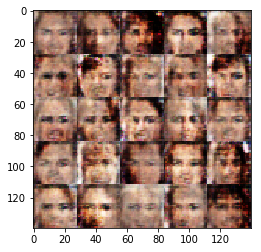

Iter 611... Discriminator Loss: 1.8938... Generator Loss: 0.3635
Iter 621... Discriminator Loss: 1.0517... Generator Loss: 0.8170
Iter 631... Discriminator Loss: 1.0587... Generator Loss: 1.0731
Iter 641... Discriminator Loss: 1.5906... Generator Loss: 0.6437
Iter 651... Discriminator Loss: 1.8482... Generator Loss: 0.3525
Iter 661... Discriminator Loss: 1.0980... Generator Loss: 0.7858
Iter 671... Discriminator Loss: 0.9226... Generator Loss: 1.5554
Iter 681... Discriminator Loss: 0.9483... Generator Loss: 0.9034
Iter 691... Discriminator Loss: 1.0575... Generator Loss: 0.8118
Iter 701... Discriminator Loss: 1.1725... Generator Loss: 2.0609


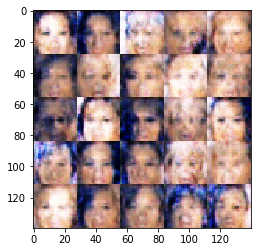

Iter 711... Discriminator Loss: 1.3442... Generator Loss: 0.6018
Iter 721... Discriminator Loss: 0.9703... Generator Loss: 1.1448
Iter 731... Discriminator Loss: 1.7892... Generator Loss: 0.3213
Iter 741... Discriminator Loss: 1.2987... Generator Loss: 0.5625
Iter 751... Discriminator Loss: 1.2558... Generator Loss: 0.8312
Iter 761... Discriminator Loss: 1.5217... Generator Loss: 1.0502
Iter 771... Discriminator Loss: 1.4557... Generator Loss: 0.5121
Iter 781... Discriminator Loss: 1.1737... Generator Loss: 1.0844
Iter 791... Discriminator Loss: 1.7232... Generator Loss: 0.3467
Iter 801... Discriminator Loss: 1.2143... Generator Loss: 2.2683


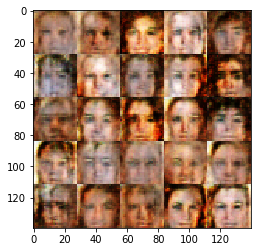

Iter 811... Discriminator Loss: 1.2230... Generator Loss: 1.9077
Iter 821... Discriminator Loss: 1.5436... Generator Loss: 0.4722
Iter 831... Discriminator Loss: 1.7921... Generator Loss: 0.4265
Iter 841... Discriminator Loss: 1.3476... Generator Loss: 0.5302
Iter 851... Discriminator Loss: 0.8951... Generator Loss: 1.5220
Iter 861... Discriminator Loss: 1.9126... Generator Loss: 0.3013
Iter 871... Discriminator Loss: 1.6554... Generator Loss: 2.8623
Iter 881... Discriminator Loss: 1.2483... Generator Loss: 0.8524
Iter 891... Discriminator Loss: 1.2231... Generator Loss: 0.7463
Iter 901... Discriminator Loss: 1.6359... Generator Loss: 0.4204


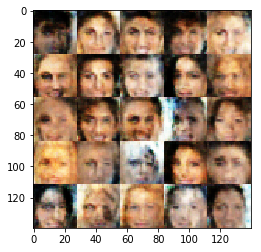

Iter 911... Discriminator Loss: 1.2740... Generator Loss: 1.6597
Iter 921... Discriminator Loss: 0.8218... Generator Loss: 1.2858
Iter 931... Discriminator Loss: 1.0492... Generator Loss: 0.7733
Iter 941... Discriminator Loss: 1.4779... Generator Loss: 0.4795
Iter 951... Discriminator Loss: 1.5054... Generator Loss: 0.4846
Iter 961... Discriminator Loss: 1.5551... Generator Loss: 0.4833
Iter 971... Discriminator Loss: 1.3483... Generator Loss: 0.4625
Iter 981... Discriminator Loss: 1.5047... Generator Loss: 1.9983
Iter 991... Discriminator Loss: 1.0758... Generator Loss: 1.0968
Iter 1001... Discriminator Loss: 1.3013... Generator Loss: 0.8475


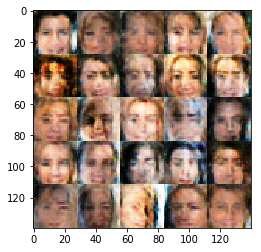

Iter 1011... Discriminator Loss: 1.3093... Generator Loss: 0.5496
Iter 1021... Discriminator Loss: 1.3190... Generator Loss: 1.6276
Iter 1031... Discriminator Loss: 1.0863... Generator Loss: 1.5745
Iter 1041... Discriminator Loss: 1.0261... Generator Loss: 1.0848
Iter 1051... Discriminator Loss: 0.8764... Generator Loss: 1.5876
Iter 1061... Discriminator Loss: 1.0692... Generator Loss: 0.8139
Iter 1071... Discriminator Loss: 1.4252... Generator Loss: 1.6800
Iter 1081... Discriminator Loss: 1.3935... Generator Loss: 0.5701
Iter 1091... Discriminator Loss: 1.1932... Generator Loss: 0.7981
Iter 1101... Discriminator Loss: 1.2021... Generator Loss: 0.5402


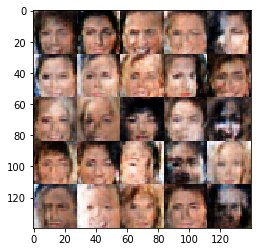

Iter 1111... Discriminator Loss: 0.9935... Generator Loss: 0.9449
Iter 1121... Discriminator Loss: 1.3421... Generator Loss: 0.8339
Iter 1131... Discriminator Loss: 1.0323... Generator Loss: 1.1223
Iter 1141... Discriminator Loss: 1.2852... Generator Loss: 0.4393
Iter 1151... Discriminator Loss: 1.0617... Generator Loss: 0.7409
Iter 1161... Discriminator Loss: 0.9635... Generator Loss: 0.8680
Iter 1171... Discriminator Loss: 1.2893... Generator Loss: 0.4547
Iter 1181... Discriminator Loss: 1.0370... Generator Loss: 1.1554
Iter 1191... Discriminator Loss: 1.0050... Generator Loss: 1.1842
Iter 1201... Discriminator Loss: 0.9531... Generator Loss: 1.1827


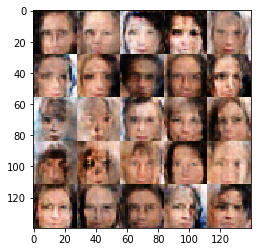

Iter 1211... Discriminator Loss: 0.9682... Generator Loss: 1.4057
Iter 1221... Discriminator Loss: 1.3877... Generator Loss: 0.4281
Iter 1231... Discriminator Loss: 1.6907... Generator Loss: 0.3617
Iter 1241... Discriminator Loss: 1.4088... Generator Loss: 0.6851
Iter 1251... Discriminator Loss: 1.1499... Generator Loss: 0.9095
Iter 1261... Discriminator Loss: 1.5720... Generator Loss: 0.5373
Iter 1271... Discriminator Loss: 1.2232... Generator Loss: 0.8469
Iter 1281... Discriminator Loss: 1.1496... Generator Loss: 0.5921
Iter 1291... Discriminator Loss: 1.2570... Generator Loss: 0.6438
Iter 1301... Discriminator Loss: 0.9578... Generator Loss: 1.0597


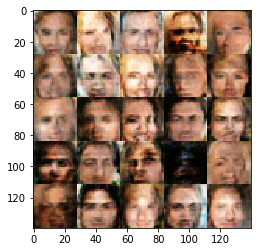

Iter 1311... Discriminator Loss: 0.8964... Generator Loss: 1.1757
Iter 1321... Discriminator Loss: 1.3862... Generator Loss: 0.6077
Iter 1331... Discriminator Loss: 1.3945... Generator Loss: 0.5025
Iter 1341... Discriminator Loss: 1.0187... Generator Loss: 1.0344
Iter 1351... Discriminator Loss: 1.7013... Generator Loss: 0.4022
Iter 1361... Discriminator Loss: 1.2780... Generator Loss: 0.6379
Iter 1371... Discriminator Loss: 1.0282... Generator Loss: 0.8660
Iter 1381... Discriminator Loss: 1.1403... Generator Loss: 1.0357
Iter 1391... Discriminator Loss: 0.9476... Generator Loss: 0.9524
Iter 1401... Discriminator Loss: 1.0057... Generator Loss: 1.3354


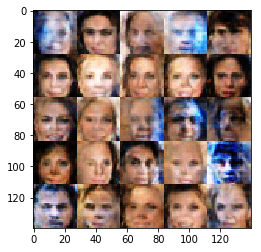

Iter 1411... Discriminator Loss: 1.3206... Generator Loss: 0.4963
Iter 1421... Discriminator Loss: 1.1896... Generator Loss: 0.8100
Iter 1431... Discriminator Loss: 1.0535... Generator Loss: 0.7903
Iter 1441... Discriminator Loss: 1.0690... Generator Loss: 0.6474
Iter 1451... Discriminator Loss: 1.7437... Generator Loss: 0.3950
Iter 1461... Discriminator Loss: 1.0941... Generator Loss: 1.1359
Iter 1471... Discriminator Loss: 0.9182... Generator Loss: 1.0321
Iter 1481... Discriminator Loss: 1.1928... Generator Loss: 0.8471
Iter 1491... Discriminator Loss: 1.3617... Generator Loss: 0.4366
Iter 1501... Discriminator Loss: 1.5659... Generator Loss: 0.4468


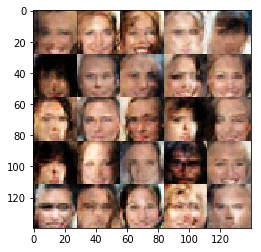

Iter 1511... Discriminator Loss: 1.0125... Generator Loss: 1.2962
Iter 1521... Discriminator Loss: 1.2332... Generator Loss: 0.8662
Iter 1531... Discriminator Loss: 1.2726... Generator Loss: 0.6127
Iter 1541... Discriminator Loss: 0.9091... Generator Loss: 1.0081
Iter 1551... Discriminator Loss: 0.9487... Generator Loss: 0.8374
Iter 1561... Discriminator Loss: 1.2904... Generator Loss: 0.6908
Iter 1571... Discriminator Loss: 1.0125... Generator Loss: 0.7391
Iter 1581... Discriminator Loss: 1.3372... Generator Loss: 1.8638
Iter 1591... Discriminator Loss: 1.0206... Generator Loss: 1.1557
Iter 1601... Discriminator Loss: 1.1703... Generator Loss: 0.8977


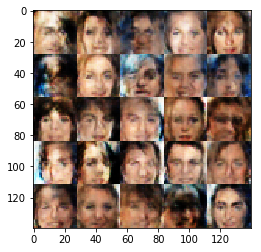

Iter 1611... Discriminator Loss: 0.9947... Generator Loss: 1.0235
Iter 1621... Discriminator Loss: 1.2797... Generator Loss: 0.6892
Iter 1631... Discriminator Loss: 1.1824... Generator Loss: 0.5978
Iter 1641... Discriminator Loss: 1.2589... Generator Loss: 0.6239
Iter 1651... Discriminator Loss: 1.1211... Generator Loss: 0.8207
Iter 1661... Discriminator Loss: 1.5411... Generator Loss: 0.4653
Iter 1671... Discriminator Loss: 0.9711... Generator Loss: 1.2105
Iter 1681... Discriminator Loss: 1.3712... Generator Loss: 1.7030
Iter 1691... Discriminator Loss: 0.8565... Generator Loss: 1.5498
Iter 1701... Discriminator Loss: 0.9898... Generator Loss: 1.3634


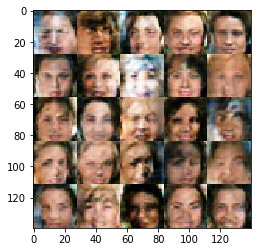

Iter 1711... Discriminator Loss: 1.2409... Generator Loss: 1.3777
Iter 1721... Discriminator Loss: 1.2935... Generator Loss: 1.5396
Iter 1731... Discriminator Loss: 1.2458... Generator Loss: 0.8754
Iter 1741... Discriminator Loss: 1.0858... Generator Loss: 1.2979
Iter 1751... Discriminator Loss: 1.4124... Generator Loss: 0.5989
Iter 1761... Discriminator Loss: 1.4971... Generator Loss: 0.4962
Iter 1771... Discriminator Loss: 0.9793... Generator Loss: 1.0290
Iter 1781... Discriminator Loss: 0.9376... Generator Loss: 0.8801
Iter 1791... Discriminator Loss: 1.8414... Generator Loss: 0.3781
Iter 1801... Discriminator Loss: 1.2196... Generator Loss: 0.5566


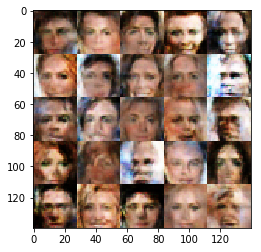

Iter 1811... Discriminator Loss: 1.1892... Generator Loss: 1.4739
Iter 1821... Discriminator Loss: 0.9237... Generator Loss: 1.1627
Iter 1831... Discriminator Loss: 0.9000... Generator Loss: 1.0207
Iter 1841... Discriminator Loss: 1.2586... Generator Loss: 0.6083
Iter 1851... Discriminator Loss: 1.0744... Generator Loss: 1.1044
Iter 1861... Discriminator Loss: 1.2419... Generator Loss: 0.6963
Iter 1871... Discriminator Loss: 0.9452... Generator Loss: 1.0342
Iter 1881... Discriminator Loss: 1.0356... Generator Loss: 1.1495
Iter 1891... Discriminator Loss: 1.3878... Generator Loss: 0.6067
Iter 1901... Discriminator Loss: 1.8186... Generator Loss: 0.2999


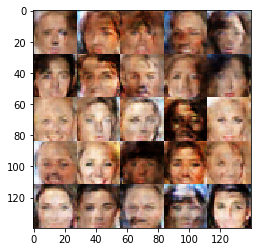

Iter 1911... Discriminator Loss: 1.7815... Generator Loss: 0.2976
Iter 1921... Discriminator Loss: 1.2000... Generator Loss: 0.6541
Iter 1931... Discriminator Loss: 1.1600... Generator Loss: 1.6312
Iter 1941... Discriminator Loss: 1.3673... Generator Loss: 0.5129
Iter 1951... Discriminator Loss: 0.9506... Generator Loss: 0.8770
Iter 1961... Discriminator Loss: 1.6912... Generator Loss: 0.3339
Iter 1971... Discriminator Loss: 1.1648... Generator Loss: 0.8651
Iter 1981... Discriminator Loss: 1.0976... Generator Loss: 0.9246
Iter 1991... Discriminator Loss: 1.2322... Generator Loss: 0.7070
Iter 2001... Discriminator Loss: 1.4330... Generator Loss: 0.4856


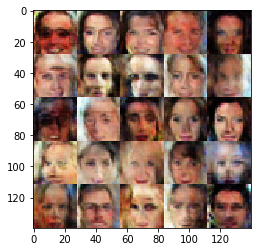

Iter 2011... Discriminator Loss: 0.9455... Generator Loss: 1.6185
Iter 2021... Discriminator Loss: 1.5768... Generator Loss: 0.4879
Iter 2031... Discriminator Loss: 1.3316... Generator Loss: 0.5551
Iter 2041... Discriminator Loss: 1.3873... Generator Loss: 0.5051
Iter 2051... Discriminator Loss: 1.0411... Generator Loss: 0.9183
Iter 2061... Discriminator Loss: 0.9815... Generator Loss: 1.0656
Iter 2071... Discriminator Loss: 1.2685... Generator Loss: 0.8270
Iter 2081... Discriminator Loss: 1.2950... Generator Loss: 0.6346
Iter 2091... Discriminator Loss: 1.0122... Generator Loss: 0.9650
Iter 2101... Discriminator Loss: 1.2876... Generator Loss: 0.6167


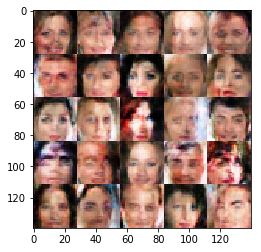

Iter 2111... Discriminator Loss: 1.1176... Generator Loss: 1.2827
Iter 2121... Discriminator Loss: 1.0903... Generator Loss: 1.6419
Iter 2131... Discriminator Loss: 1.5253... Generator Loss: 0.4994
Iter 2141... Discriminator Loss: 1.8241... Generator Loss: 0.4480
Iter 2151... Discriminator Loss: 1.0858... Generator Loss: 0.6263
Iter 2161... Discriminator Loss: 1.2819... Generator Loss: 0.6528
Iter 2171... Discriminator Loss: 1.0631... Generator Loss: 1.1340
Iter 2181... Discriminator Loss: 1.0981... Generator Loss: 0.9081
Iter 2191... Discriminator Loss: 1.6374... Generator Loss: 0.4702
Iter 2201... Discriminator Loss: 1.0561... Generator Loss: 1.4721


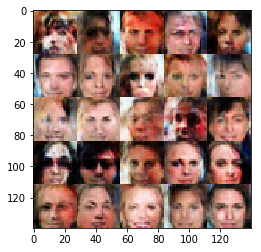

Iter 2211... Discriminator Loss: 1.1092... Generator Loss: 0.6493
Iter 2221... Discriminator Loss: 1.1646... Generator Loss: 0.7685
Iter 2231... Discriminator Loss: 1.7551... Generator Loss: 0.2891
Iter 2241... Discriminator Loss: 1.1760... Generator Loss: 0.8537
Iter 2251... Discriminator Loss: 1.1507... Generator Loss: 0.7784
Iter 2261... Discriminator Loss: 1.3044... Generator Loss: 0.7182
Iter 2271... Discriminator Loss: 2.3276... Generator Loss: 0.2316
Iter 2281... Discriminator Loss: 1.1650... Generator Loss: 1.3416
Iter 2291... Discriminator Loss: 1.5633... Generator Loss: 0.4732
Iter 2301... Discriminator Loss: 1.1174... Generator Loss: 0.8197


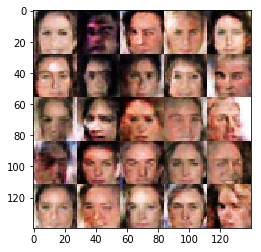

Iter 2311... Discriminator Loss: 1.0015... Generator Loss: 0.9376
Iter 2321... Discriminator Loss: 1.3502... Generator Loss: 0.8050
Iter 2331... Discriminator Loss: 0.9284... Generator Loss: 1.3093
Iter 2341... Discriminator Loss: 1.0461... Generator Loss: 0.9341
Iter 2351... Discriminator Loss: 1.0079... Generator Loss: 1.1370
Iter 2361... Discriminator Loss: 1.1205... Generator Loss: 1.2302
Iter 2371... Discriminator Loss: 1.4752... Generator Loss: 0.3937
Iter 2381... Discriminator Loss: 1.0967... Generator Loss: 1.1045
Iter 2391... Discriminator Loss: 1.5223... Generator Loss: 0.4036
Iter 2401... Discriminator Loss: 0.9770... Generator Loss: 1.2963


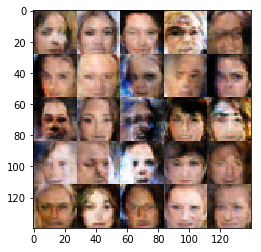

Iter 2411... Discriminator Loss: 1.1409... Generator Loss: 0.7903
Iter 2421... Discriminator Loss: 0.9230... Generator Loss: 1.5155
Iter 2431... Discriminator Loss: 0.8951... Generator Loss: 0.9911
Iter 2441... Discriminator Loss: 0.9077... Generator Loss: 1.1881
Iter 2451... Discriminator Loss: 1.1885... Generator Loss: 0.5740
Iter 2461... Discriminator Loss: 1.1008... Generator Loss: 0.9379
Iter 2471... Discriminator Loss: 1.8458... Generator Loss: 0.3002
Iter 2481... Discriminator Loss: 1.1572... Generator Loss: 0.7432
Iter 2491... Discriminator Loss: 1.1036... Generator Loss: 0.7277
Iter 2501... Discriminator Loss: 1.0789... Generator Loss: 1.3263


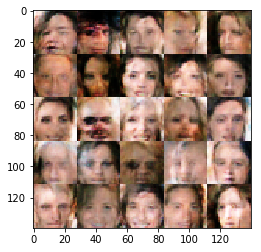

Iter 2511... Discriminator Loss: 1.7151... Generator Loss: 0.3615
Iter 2521... Discriminator Loss: 1.4919... Generator Loss: 0.7706
Iter 2531... Discriminator Loss: 0.9969... Generator Loss: 1.4033
Iter 2541... Discriminator Loss: 0.8408... Generator Loss: 1.5805
Iter 2551... Discriminator Loss: 1.0548... Generator Loss: 1.2175
Iter 2561... Discriminator Loss: 1.0343... Generator Loss: 1.1930
Iter 2571... Discriminator Loss: 0.8981... Generator Loss: 1.2037
Iter 2581... Discriminator Loss: 1.1511... Generator Loss: 1.3529
Iter 2591... Discriminator Loss: 1.0278... Generator Loss: 1.0728
Iter 2601... Discriminator Loss: 1.1639... Generator Loss: 1.3843


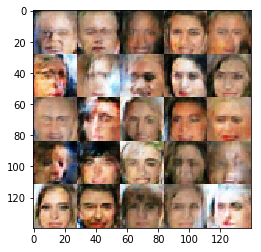

Iter 2611... Discriminator Loss: 0.8201... Generator Loss: 1.3284
Iter 2621... Discriminator Loss: 1.4517... Generator Loss: 0.4951
Iter 2631... Discriminator Loss: 1.1395... Generator Loss: 0.9526
Iter 2641... Discriminator Loss: 1.4150... Generator Loss: 0.6811
Iter 2651... Discriminator Loss: 1.7197... Generator Loss: 0.4733
Iter 2661... Discriminator Loss: 1.4212... Generator Loss: 0.9474
Iter 2671... Discriminator Loss: 1.8239... Generator Loss: 0.4319
Iter 2681... Discriminator Loss: 1.3004... Generator Loss: 0.4972
Iter 2691... Discriminator Loss: 1.1777... Generator Loss: 1.6797
Iter 2701... Discriminator Loss: 1.2316... Generator Loss: 0.8140


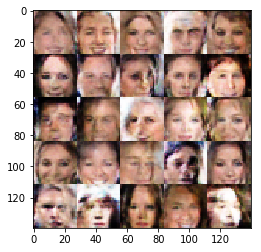

Iter 2711... Discriminator Loss: 0.9542... Generator Loss: 0.9358
Iter 2721... Discriminator Loss: 0.8804... Generator Loss: 1.2477
Iter 2731... Discriminator Loss: 0.9931... Generator Loss: 0.9739
Iter 2741... Discriminator Loss: 0.6659... Generator Loss: 1.6640
Iter 2751... Discriminator Loss: 1.3762... Generator Loss: 0.7177
Iter 2761... Discriminator Loss: 1.1787... Generator Loss: 0.6261
Iter 2771... Discriminator Loss: 0.8964... Generator Loss: 1.5976
Iter 2781... Discriminator Loss: 1.0239... Generator Loss: 1.0088
Iter 2791... Discriminator Loss: 0.9432... Generator Loss: 1.2845
Iter 2801... Discriminator Loss: 1.1064... Generator Loss: 0.9278


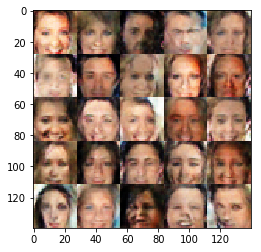

Iter 2811... Discriminator Loss: 1.8423... Generator Loss: 0.2690
Iter 2821... Discriminator Loss: 0.9930... Generator Loss: 1.7601
Iter 2831... Discriminator Loss: 1.3860... Generator Loss: 0.5692
Iter 2841... Discriminator Loss: 1.3851... Generator Loss: 0.4148
Iter 2851... Discriminator Loss: 1.3329... Generator Loss: 0.6625
Iter 2861... Discriminator Loss: 1.8183... Generator Loss: 0.4154
Iter 2871... Discriminator Loss: 1.3555... Generator Loss: 0.5509
Iter 2881... Discriminator Loss: 1.0979... Generator Loss: 0.7912
Iter 2891... Discriminator Loss: 1.3840... Generator Loss: 0.5546
Iter 2901... Discriminator Loss: 1.0271... Generator Loss: 1.4750


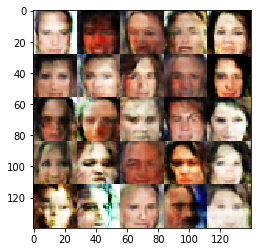

Iter 2911... Discriminator Loss: 1.4984... Generator Loss: 0.6281
Iter 2921... Discriminator Loss: 1.5243... Generator Loss: 0.3979
Iter 2931... Discriminator Loss: 0.8918... Generator Loss: 0.8051
Iter 2941... Discriminator Loss: 1.2974... Generator Loss: 0.5791
Iter 2951... Discriminator Loss: 1.2994... Generator Loss: 0.9024
Iter 2961... Discriminator Loss: 1.1076... Generator Loss: 0.5880
Iter 2971... Discriminator Loss: 1.3054... Generator Loss: 0.5622
Iter 2981... Discriminator Loss: 1.5604... Generator Loss: 0.7452
Iter 2991... Discriminator Loss: 1.3251... Generator Loss: 0.6575
Iter 3001... Discriminator Loss: 0.9187... Generator Loss: 2.0943


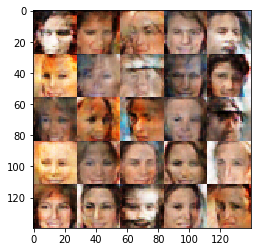

Iter 3011... Discriminator Loss: 0.9839... Generator Loss: 1.1287
Iter 3021... Discriminator Loss: 0.8300... Generator Loss: 1.0988
Iter 3031... Discriminator Loss: 1.4227... Generator Loss: 0.7417
Iter 3041... Discriminator Loss: 1.0330... Generator Loss: 0.8132
Iter 3051... Discriminator Loss: 1.5075... Generator Loss: 0.4373
Iter 3061... Discriminator Loss: 0.9896... Generator Loss: 1.2927
Iter 3071... Discriminator Loss: 1.2831... Generator Loss: 0.7864
Iter 3081... Discriminator Loss: 1.2764... Generator Loss: 0.6587
Iter 3091... Discriminator Loss: 1.3943... Generator Loss: 1.0381
Iter 3101... Discriminator Loss: 0.8661... Generator Loss: 1.5508


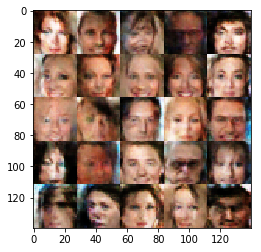

Iter 3111... Discriminator Loss: 1.0928... Generator Loss: 0.8414
Iter 3121... Discriminator Loss: 0.8784... Generator Loss: 1.1564
Iter 3131... Discriminator Loss: 1.0194... Generator Loss: 0.8306
Iter 3141... Discriminator Loss: 0.9560... Generator Loss: 0.7865
Iter 3151... Discriminator Loss: 1.1268... Generator Loss: 0.9783
Iter 3161... Discriminator Loss: 0.9382... Generator Loss: 0.9163
Iter 3171... Discriminator Loss: 1.0835... Generator Loss: 1.5557
Iter 3181... Discriminator Loss: 1.0043... Generator Loss: 2.1362
Iter 3191... Discriminator Loss: 0.9891... Generator Loss: 1.1546
Iter 3201... Discriminator Loss: 2.1279... Generator Loss: 0.2092


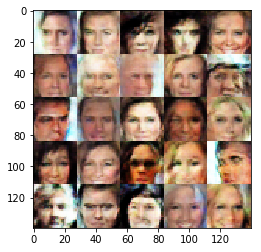

Iter 3211... Discriminator Loss: 0.9772... Generator Loss: 0.8222
Iter 3221... Discriminator Loss: 1.3900... Generator Loss: 0.6408
Iter 3231... Discriminator Loss: 1.1780... Generator Loss: 0.7341
Iter 3241... Discriminator Loss: 1.1586... Generator Loss: 0.7793
Iter 3251... Discriminator Loss: 1.1971... Generator Loss: 1.1271
Iter 3261... Discriminator Loss: 1.3257... Generator Loss: 0.7051
Iter 3271... Discriminator Loss: 1.1796... Generator Loss: 0.7487
Iter 3281... Discriminator Loss: 0.8678... Generator Loss: 1.5240
Iter 3291... Discriminator Loss: 1.1498... Generator Loss: 0.8247
Iter 3301... Discriminator Loss: 2.0879... Generator Loss: 0.3592


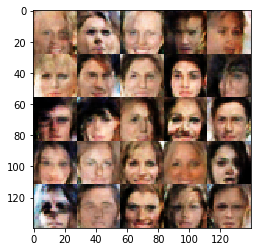

Iter 3311... Discriminator Loss: 1.0689... Generator Loss: 1.7353
Iter 3321... Discriminator Loss: 1.0859... Generator Loss: 1.0968
Iter 3331... Discriminator Loss: 1.8293... Generator Loss: 0.3811
Iter 3341... Discriminator Loss: 1.0716... Generator Loss: 0.8583
Iter 3351... Discriminator Loss: 0.9591... Generator Loss: 1.7315
Iter 3361... Discriminator Loss: 1.1045... Generator Loss: 0.6947
Iter 3371... Discriminator Loss: 1.3709... Generator Loss: 0.6850
Iter 3381... Discriminator Loss: 0.8647... Generator Loss: 1.4208
Iter 3391... Discriminator Loss: 1.2007... Generator Loss: 0.8502
Iter 3401... Discriminator Loss: 1.1605... Generator Loss: 0.6818


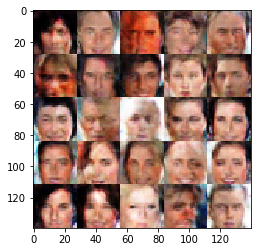

Iter 3411... Discriminator Loss: 0.7340... Generator Loss: 1.6027
Iter 3421... Discriminator Loss: 1.7407... Generator Loss: 0.2968
Iter 3431... Discriminator Loss: 1.3287... Generator Loss: 0.6873
Iter 3441... Discriminator Loss: 1.0894... Generator Loss: 0.9274
Iter 3451... Discriminator Loss: 0.8535... Generator Loss: 1.8866
Iter 3461... Discriminator Loss: 0.9786... Generator Loss: 1.1655
Iter 3471... Discriminator Loss: 0.8029... Generator Loss: 0.9161
Iter 3481... Discriminator Loss: 1.1968... Generator Loss: 1.0655
Iter 3491... Discriminator Loss: 0.9415... Generator Loss: 1.2733
Iter 3501... Discriminator Loss: 1.0416... Generator Loss: 1.0661


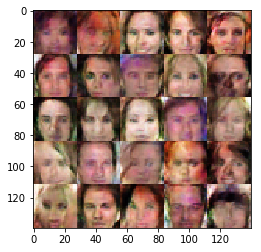

Iter 3511... Discriminator Loss: 1.2912... Generator Loss: 0.9717
Iter 3521... Discriminator Loss: 1.0286... Generator Loss: 0.8260
Iter 3531... Discriminator Loss: 1.6206... Generator Loss: 0.5418
Iter 3541... Discriminator Loss: 1.2647... Generator Loss: 0.7726
Iter 3551... Discriminator Loss: 0.9341... Generator Loss: 2.6767
Iter 3561... Discriminator Loss: 0.9626... Generator Loss: 1.3327
Iter 3571... Discriminator Loss: 2.0873... Generator Loss: 0.3030
Iter 3581... Discriminator Loss: 1.3816... Generator Loss: 0.5779
Iter 3591... Discriminator Loss: 1.3020... Generator Loss: 0.6164
Iter 3601... Discriminator Loss: 0.8939... Generator Loss: 1.0634


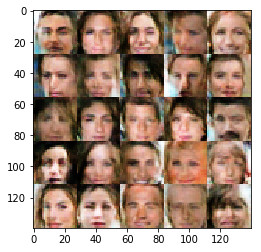

Iter 3611... Discriminator Loss: 0.8231... Generator Loss: 1.0790
Iter 3621... Discriminator Loss: 1.2692... Generator Loss: 0.8893
Iter 3631... Discriminator Loss: 1.2430... Generator Loss: 0.6911
Iter 3641... Discriminator Loss: 1.5478... Generator Loss: 0.3892
Iter 3651... Discriminator Loss: 1.1060... Generator Loss: 0.8184
Iter 3661... Discriminator Loss: 1.2138... Generator Loss: 1.6958
Iter 3671... Discriminator Loss: 1.1394... Generator Loss: 0.8125
Iter 3681... Discriminator Loss: 1.4492... Generator Loss: 0.4735
Iter 3691... Discriminator Loss: 1.1774... Generator Loss: 0.9925
Iter 3701... Discriminator Loss: 1.4948... Generator Loss: 0.5267


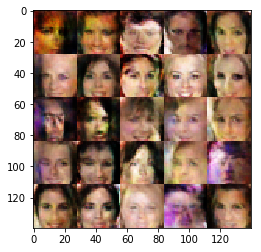

Iter 3711... Discriminator Loss: 1.0876... Generator Loss: 1.4700
Iter 3721... Discriminator Loss: 1.0519... Generator Loss: 1.3269
Iter 3731... Discriminator Loss: 0.9465... Generator Loss: 1.0938
Iter 3741... Discriminator Loss: 0.9815... Generator Loss: 2.3438
Iter 3751... Discriminator Loss: 0.9432... Generator Loss: 0.9095
Iter 3761... Discriminator Loss: 1.1407... Generator Loss: 0.5900
Iter 3771... Discriminator Loss: 0.8913... Generator Loss: 2.1460
Iter 3781... Discriminator Loss: 1.1421... Generator Loss: 0.8580
Iter 3791... Discriminator Loss: 0.8549... Generator Loss: 2.1255
Iter 3801... Discriminator Loss: 1.5119... Generator Loss: 0.5473


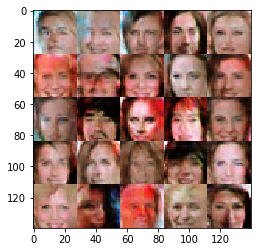

Iter 3811... Discriminator Loss: 0.7983... Generator Loss: 1.1109
Iter 3821... Discriminator Loss: 0.8926... Generator Loss: 1.0869
Iter 3831... Discriminator Loss: 0.9898... Generator Loss: 1.1622
Iter 3841... Discriminator Loss: 1.2674... Generator Loss: 0.8567
Iter 3851... Discriminator Loss: 1.5838... Generator Loss: 0.4611
Iter 3861... Discriminator Loss: 1.2449... Generator Loss: 0.6018
Iter 3871... Discriminator Loss: 1.2858... Generator Loss: 0.7392
Iter 3881... Discriminator Loss: 0.8278... Generator Loss: 1.3485
Iter 3891... Discriminator Loss: 0.9617... Generator Loss: 1.1440
Iter 3901... Discriminator Loss: 1.1846... Generator Loss: 0.7684


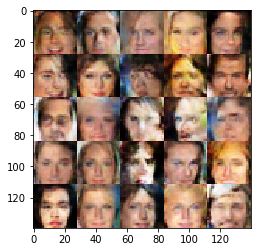

Iter 3911... Discriminator Loss: 0.9745... Generator Loss: 1.8740
Iter 3921... Discriminator Loss: 1.1516... Generator Loss: 0.9908
Iter 3931... Discriminator Loss: 1.3568... Generator Loss: 0.5039
Iter 3941... Discriminator Loss: 1.1245... Generator Loss: 0.9943
Iter 3951... Discriminator Loss: 0.7547... Generator Loss: 1.4154
Iter 3961... Discriminator Loss: 1.6547... Generator Loss: 0.4454
Iter 3971... Discriminator Loss: 1.0772... Generator Loss: 0.8751
Iter 3981... Discriminator Loss: 0.9555... Generator Loss: 0.9622
Iter 3991... Discriminator Loss: 1.4119... Generator Loss: 1.9977
Iter 4001... Discriminator Loss: 0.9177... Generator Loss: 1.5305


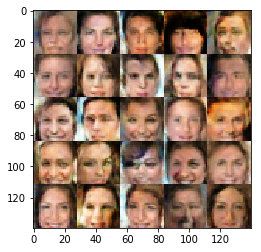

Iter 4011... Discriminator Loss: 0.8904... Generator Loss: 1.1924
Iter 4021... Discriminator Loss: 0.8652... Generator Loss: 1.5677
Iter 4031... Discriminator Loss: 1.0326... Generator Loss: 1.7377
Iter 4041... Discriminator Loss: 1.2459... Generator Loss: 0.5386
Iter 4051... Discriminator Loss: 1.3888... Generator Loss: 0.6741
Iter 4061... Discriminator Loss: 1.1336... Generator Loss: 0.9558
Iter 4071... Discriminator Loss: 1.2839... Generator Loss: 0.7006
Iter 4081... Discriminator Loss: 0.8596... Generator Loss: 1.6111
Iter 4091... Discriminator Loss: 1.3880... Generator Loss: 0.4865
Iter 4101... Discriminator Loss: 1.3351... Generator Loss: 0.6296


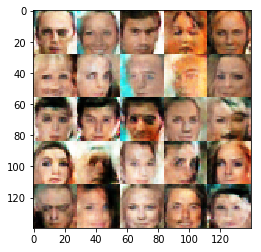

Iter 4111... Discriminator Loss: 1.6118... Generator Loss: 0.4237
Iter 4121... Discriminator Loss: 0.8503... Generator Loss: 1.1470
Iter 4131... Discriminator Loss: 0.8897... Generator Loss: 1.3481
Iter 4141... Discriminator Loss: 1.4623... Generator Loss: 1.8300
Iter 4151... Discriminator Loss: 0.9115... Generator Loss: 1.1296
Iter 4161... Discriminator Loss: 1.5797... Generator Loss: 0.5475
Iter 4171... Discriminator Loss: 0.8967... Generator Loss: 1.2524
Iter 4181... Discriminator Loss: 0.8094... Generator Loss: 1.6602
Iter 4191... Discriminator Loss: 1.6684... Generator Loss: 0.5216
Iter 4201... Discriminator Loss: 1.6764... Generator Loss: 0.3815


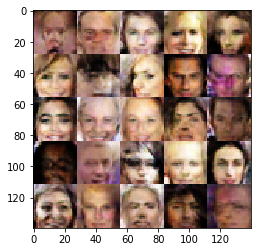

Iter 4211... Discriminator Loss: 0.8792... Generator Loss: 1.4444
Iter 4221... Discriminator Loss: 1.6034... Generator Loss: 0.4940
Iter 4231... Discriminator Loss: 1.0444... Generator Loss: 0.6285
Iter 4241... Discriminator Loss: 1.0055... Generator Loss: 1.0103
Iter 4251... Discriminator Loss: 0.8974... Generator Loss: 1.0019
Iter 4261... Discriminator Loss: 1.3433... Generator Loss: 2.7248
Iter 4271... Discriminator Loss: 0.8855... Generator Loss: 1.3198
Iter 4281... Discriminator Loss: 1.0217... Generator Loss: 0.7516
Iter 4291... Discriminator Loss: 1.1946... Generator Loss: 0.7867
Iter 4301... Discriminator Loss: 0.7955... Generator Loss: 1.3361


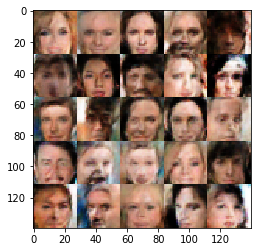

Iter 4311... Discriminator Loss: 0.9545... Generator Loss: 2.3997
Iter 4321... Discriminator Loss: 0.7464... Generator Loss: 1.2780
Iter 4331... Discriminator Loss: 1.0316... Generator Loss: 0.8506
Iter 4341... Discriminator Loss: 1.9036... Generator Loss: 0.3451
Iter 4351... Discriminator Loss: 1.0779... Generator Loss: 0.7823
Iter 4361... Discriminator Loss: 1.6110... Generator Loss: 0.6358
Iter 4371... Discriminator Loss: 0.8218... Generator Loss: 1.7932
Iter 4381... Discriminator Loss: 1.0809... Generator Loss: 2.2384
Iter 4391... Discriminator Loss: 2.2877... Generator Loss: 0.3120
Iter 4401... Discriminator Loss: 1.1715... Generator Loss: 1.4157


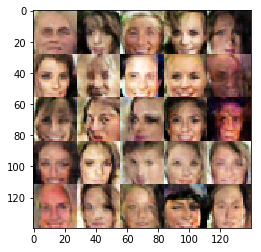

Iter 4411... Discriminator Loss: 1.3257... Generator Loss: 0.5384
Iter 4421... Discriminator Loss: 1.1325... Generator Loss: 1.6670
Iter 4431... Discriminator Loss: 1.3205... Generator Loss: 0.6120
Iter 4441... Discriminator Loss: 1.1953... Generator Loss: 0.7174
Iter 4451... Discriminator Loss: 1.4029... Generator Loss: 0.4718
Iter 4461... Discriminator Loss: 0.8409... Generator Loss: 0.7999
Iter 4471... Discriminator Loss: 2.2395... Generator Loss: 0.1532
Iter 4481... Discriminator Loss: 1.0879... Generator Loss: 1.5925
Iter 4491... Discriminator Loss: 1.0772... Generator Loss: 0.9345
Iter 4501... Discriminator Loss: 1.3989... Generator Loss: 0.5853


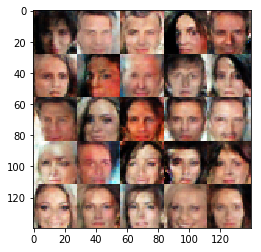

Iter 4511... Discriminator Loss: 0.8930... Generator Loss: 1.7949
Iter 4521... Discriminator Loss: 0.8130... Generator Loss: 1.4830
Iter 4531... Discriminator Loss: 1.7534... Generator Loss: 0.3720
Iter 4541... Discriminator Loss: 0.7548... Generator Loss: 2.0339
Iter 4551... Discriminator Loss: 0.9889... Generator Loss: 1.3107
Iter 4561... Discriminator Loss: 1.3850... Generator Loss: 0.6342
Iter 4571... Discriminator Loss: 0.8040... Generator Loss: 1.3556
Iter 4581... Discriminator Loss: 0.9699... Generator Loss: 1.3060
Iter 4591... Discriminator Loss: 1.3595... Generator Loss: 0.6153
Iter 4601... Discriminator Loss: 1.6132... Generator Loss: 0.5471


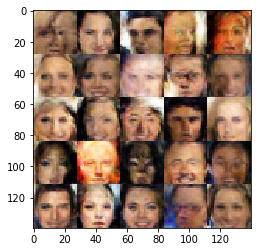

Iter 4611... Discriminator Loss: 1.1006... Generator Loss: 0.9463
Iter 4621... Discriminator Loss: 1.3793... Generator Loss: 0.6866
Iter 4631... Discriminator Loss: 1.1924... Generator Loss: 0.8505
Iter 4641... Discriminator Loss: 0.6944... Generator Loss: 1.6986
Iter 4651... Discriminator Loss: 0.9143... Generator Loss: 0.8169
Iter 4661... Discriminator Loss: 0.7561... Generator Loss: 1.2872
Iter 4671... Discriminator Loss: 1.3045... Generator Loss: 0.6628
Iter 4681... Discriminator Loss: 0.7227... Generator Loss: 2.2906
Iter 4691... Discriminator Loss: 1.3104... Generator Loss: 0.7168
Iter 4701... Discriminator Loss: 1.0609... Generator Loss: 0.9736


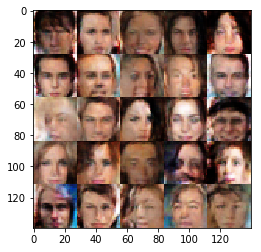

Iter 4711... Discriminator Loss: 0.7121... Generator Loss: 1.6270
Iter 4721... Discriminator Loss: 1.0240... Generator Loss: 1.0126
Iter 4731... Discriminator Loss: 0.9985... Generator Loss: 0.9974
Iter 4741... Discriminator Loss: 1.4078... Generator Loss: 0.5520
Iter 4751... Discriminator Loss: 1.3497... Generator Loss: 0.5800
Iter 4761... Discriminator Loss: 1.5232... Generator Loss: 0.5502
Iter 4771... Discriminator Loss: 0.9002... Generator Loss: 1.1137
Iter 4781... Discriminator Loss: 0.8229... Generator Loss: 1.2698
Iter 4791... Discriminator Loss: 0.8547... Generator Loss: 1.3214
Iter 4801... Discriminator Loss: 0.8706... Generator Loss: 1.6271


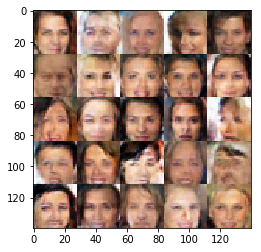

Iter 4811... Discriminator Loss: 1.1681... Generator Loss: 0.8488
Iter 4821... Discriminator Loss: 1.0271... Generator Loss: 1.0408
Iter 4831... Discriminator Loss: 1.0294... Generator Loss: 0.8877
Iter 4841... Discriminator Loss: 1.1105... Generator Loss: 0.7600
Iter 4851... Discriminator Loss: 0.8754... Generator Loss: 0.9002
Iter 4861... Discriminator Loss: 0.7562... Generator Loss: 2.2420
Iter 4871... Discriminator Loss: 1.5626... Generator Loss: 0.5546
Iter 4881... Discriminator Loss: 1.0787... Generator Loss: 1.5906
Iter 4891... Discriminator Loss: 1.0124... Generator Loss: 1.2917
Iter 4901... Discriminator Loss: 1.4334... Generator Loss: 0.4830


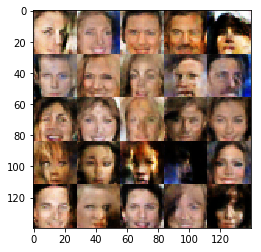

Iter 4911... Discriminator Loss: 0.9372... Generator Loss: 1.3096
Iter 4921... Discriminator Loss: 0.9440... Generator Loss: 1.0627
Iter 4931... Discriminator Loss: 0.7229... Generator Loss: 1.1546
Iter 4941... Discriminator Loss: 1.0261... Generator Loss: 1.2761
Iter 4951... Discriminator Loss: 1.1805... Generator Loss: 0.9503
Iter 4961... Discriminator Loss: 1.0596... Generator Loss: 1.0210
Iter 4971... Discriminator Loss: 1.0027... Generator Loss: 1.2917
Iter 4981... Discriminator Loss: 0.8785... Generator Loss: 1.1995
Iter 4991... Discriminator Loss: 1.1264... Generator Loss: 0.9180
Iter 5001... Discriminator Loss: 0.7440... Generator Loss: 1.6674


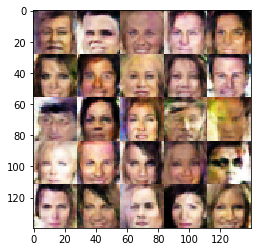

Iter 5011... Discriminator Loss: 1.1474... Generator Loss: 0.7101
Iter 5021... Discriminator Loss: 1.0833... Generator Loss: 0.6314
Iter 5031... Discriminator Loss: 1.4277... Generator Loss: 0.5329
Iter 5041... Discriminator Loss: 1.3447... Generator Loss: 0.6975
Iter 5051... Discriminator Loss: 1.6622... Generator Loss: 2.5227
Iter 5061... Discriminator Loss: 1.3800... Generator Loss: 0.5585
Iter 5071... Discriminator Loss: 0.8676... Generator Loss: 0.9939
Iter 5081... Discriminator Loss: 1.0173... Generator Loss: 0.7965
Iter 5091... Discriminator Loss: 1.0586... Generator Loss: 0.9545
Iter 5101... Discriminator Loss: 1.6863... Generator Loss: 0.4477


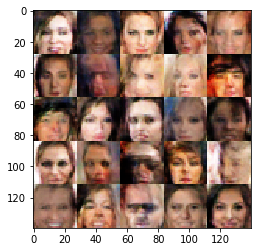

Iter 5111... Discriminator Loss: 1.9198... Generator Loss: 0.3539
Iter 5121... Discriminator Loss: 1.1181... Generator Loss: 0.8390
Iter 5131... Discriminator Loss: 0.7764... Generator Loss: 1.0276
Iter 5141... Discriminator Loss: 0.8458... Generator Loss: 1.8655
Iter 5151... Discriminator Loss: 1.4182... Generator Loss: 0.6683
Iter 5161... Discriminator Loss: 0.8800... Generator Loss: 1.5662
Iter 5171... Discriminator Loss: 1.2104... Generator Loss: 0.6616
Iter 5181... Discriminator Loss: 0.7817... Generator Loss: 1.4684
Iter 5191... Discriminator Loss: 1.2869... Generator Loss: 0.9296
Iter 5201... Discriminator Loss: 0.7379... Generator Loss: 2.2380


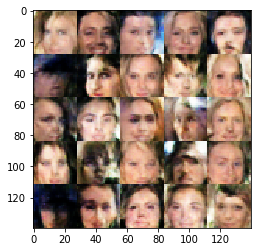

Iter 5211... Discriminator Loss: 0.6790... Generator Loss: 1.6360
Iter 5221... Discriminator Loss: 1.0226... Generator Loss: 1.1000
Iter 5231... Discriminator Loss: 1.4105... Generator Loss: 0.5023
Iter 5241... Discriminator Loss: 1.1458... Generator Loss: 0.8541
Iter 5251... Discriminator Loss: 1.0634... Generator Loss: 0.6870
Iter 5261... Discriminator Loss: 0.8041... Generator Loss: 1.9645
Iter 5271... Discriminator Loss: 1.0245... Generator Loss: 1.7246
Iter 5281... Discriminator Loss: 1.5110... Generator Loss: 0.5256
Iter 5291... Discriminator Loss: 0.7293... Generator Loss: 1.3785
Iter 5301... Discriminator Loss: 0.8969... Generator Loss: 1.6272


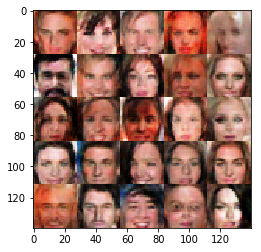

Iter 5311... Discriminator Loss: 1.2793... Generator Loss: 0.6361
Iter 5321... Discriminator Loss: 1.0675... Generator Loss: 0.8361
Iter 5331... Discriminator Loss: 0.9263... Generator Loss: 1.4773
Iter 5341... Discriminator Loss: 0.7526... Generator Loss: 1.8199
Iter 5351... Discriminator Loss: 0.7591... Generator Loss: 1.8888
Iter 5361... Discriminator Loss: 0.8774... Generator Loss: 1.2214
Iter 5371... Discriminator Loss: 1.0817... Generator Loss: 0.8869
Iter 5381... Discriminator Loss: 0.6727... Generator Loss: 1.6560
Iter 5391... Discriminator Loss: 1.7743... Generator Loss: 0.8799
Iter 5401... Discriminator Loss: 1.2807... Generator Loss: 0.8107


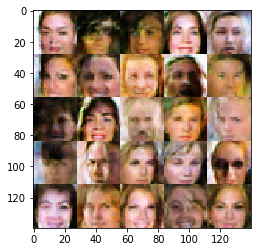

Iter 5411... Discriminator Loss: 0.9274... Generator Loss: 1.0160
Iter 5421... Discriminator Loss: 0.8193... Generator Loss: 1.3048
Iter 5431... Discriminator Loss: 0.7316... Generator Loss: 1.4395
Iter 5441... Discriminator Loss: 1.2857... Generator Loss: 0.7848
Iter 5451... Discriminator Loss: 1.2119... Generator Loss: 0.7146
Iter 5461... Discriminator Loss: 0.8502... Generator Loss: 1.3920
Iter 5471... Discriminator Loss: 0.6871... Generator Loss: 1.6808
Iter 5481... Discriminator Loss: 1.2405... Generator Loss: 0.4924
Iter 5491... Discriminator Loss: 1.3323... Generator Loss: 0.6171
Iter 5501... Discriminator Loss: 1.1853... Generator Loss: 1.8536


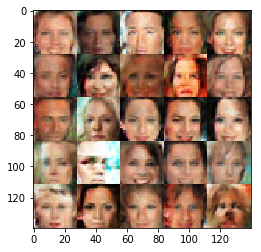

Iter 5511... Discriminator Loss: 0.9117... Generator Loss: 1.3845
Iter 5521... Discriminator Loss: 0.8730... Generator Loss: 1.1445
Iter 5531... Discriminator Loss: 1.9086... Generator Loss: 0.5661
Iter 5541... Discriminator Loss: 1.1863... Generator Loss: 0.6245
Iter 5551... Discriminator Loss: 0.7698... Generator Loss: 1.4470
Iter 5561... Discriminator Loss: 1.1613... Generator Loss: 1.1065
Iter 5571... Discriminator Loss: 1.1352... Generator Loss: 0.7153
Iter 5581... Discriminator Loss: 1.0239... Generator Loss: 0.9627
Iter 5591... Discriminator Loss: 1.4018... Generator Loss: 0.8212
Iter 5601... Discriminator Loss: 1.4827... Generator Loss: 0.5714


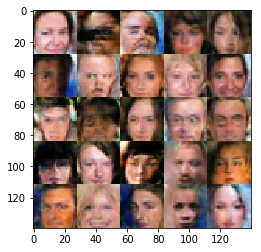

Iter 5611... Discriminator Loss: 1.1057... Generator Loss: 0.8009
Iter 5621... Discriminator Loss: 0.6891... Generator Loss: 2.3950
Iter 5631... Discriminator Loss: 1.0632... Generator Loss: 0.8963
Iter 5641... Discriminator Loss: 1.0384... Generator Loss: 0.6684
Iter 5651... Discriminator Loss: 1.1631... Generator Loss: 0.7883
Iter 5661... Discriminator Loss: 0.8572... Generator Loss: 1.4031
Iter 5671... Discriminator Loss: 1.0768... Generator Loss: 0.9064
Iter 5681... Discriminator Loss: 1.4461... Generator Loss: 0.5601
Iter 5691... Discriminator Loss: 1.0408... Generator Loss: 1.0641
Iter 5701... Discriminator Loss: 0.9002... Generator Loss: 1.5506


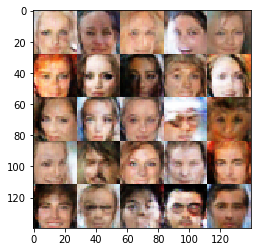

Iter 5711... Discriminator Loss: 0.8710... Generator Loss: 1.1139
Iter 5721... Discriminator Loss: 0.8538... Generator Loss: 1.0970
Iter 5731... Discriminator Loss: 0.9512... Generator Loss: 1.4795
Iter 5741... Discriminator Loss: 0.9267... Generator Loss: 1.9578
Iter 5751... Discriminator Loss: 1.2448... Generator Loss: 0.6683
Iter 5761... Discriminator Loss: 1.2879... Generator Loss: 1.3169
Iter 5771... Discriminator Loss: 1.2626... Generator Loss: 0.7182
Iter 5781... Discriminator Loss: 1.6411... Generator Loss: 0.4437
Iter 5791... Discriminator Loss: 1.0282... Generator Loss: 1.1892
Iter 5801... Discriminator Loss: 1.6446... Generator Loss: 0.4082


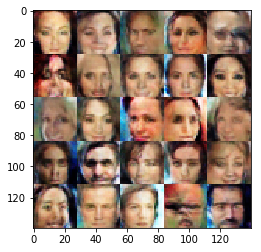

Iter 5811... Discriminator Loss: 1.1741... Generator Loss: 0.7519
Iter 5821... Discriminator Loss: 0.8236... Generator Loss: 0.9072
Iter 5831... Discriminator Loss: 0.6960... Generator Loss: 2.2369
Iter 5841... Discriminator Loss: 0.6889... Generator Loss: 2.0050
Iter 5851... Discriminator Loss: 1.6043... Generator Loss: 0.6653
Iter 5861... Discriminator Loss: 0.8852... Generator Loss: 1.8097
Iter 5871... Discriminator Loss: 0.8181... Generator Loss: 1.3815
Iter 5881... Discriminator Loss: 1.1456... Generator Loss: 0.5697
Iter 5891... Discriminator Loss: 1.0571... Generator Loss: 0.7370
Iter 5901... Discriminator Loss: 0.9072... Generator Loss: 2.1238


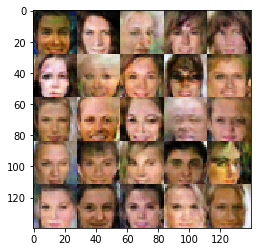

Iter 5911... Discriminator Loss: 1.5889... Generator Loss: 0.5157
Iter 5921... Discriminator Loss: 1.4839... Generator Loss: 0.4344
Iter 5931... Discriminator Loss: 0.9970... Generator Loss: 3.0422
Iter 5941... Discriminator Loss: 1.6180... Generator Loss: 0.4761
Iter 5951... Discriminator Loss: 1.0377... Generator Loss: 1.3083
Iter 5961... Discriminator Loss: 0.8324... Generator Loss: 1.4644
Iter 5971... Discriminator Loss: 1.1949... Generator Loss: 1.4270
Iter 5981... Discriminator Loss: 1.2343... Generator Loss: 0.6704
Iter 5991... Discriminator Loss: 0.9943... Generator Loss: 1.0183
Iter 6001... Discriminator Loss: 0.8353... Generator Loss: 1.6139


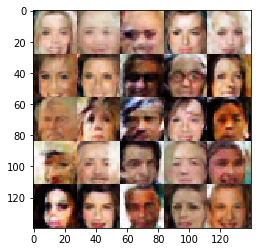

Iter 6011... Discriminator Loss: 1.1937... Generator Loss: 0.6560
Iter 6021... Discriminator Loss: 1.0119... Generator Loss: 1.2126
Iter 6031... Discriminator Loss: 0.9150... Generator Loss: 0.9834
Iter 6041... Discriminator Loss: 1.1373... Generator Loss: 1.2177
Iter 6051... Discriminator Loss: 0.7305... Generator Loss: 1.7885
Iter 6061... Discriminator Loss: 0.8757... Generator Loss: 1.5972
Iter 6071... Discriminator Loss: 1.5125... Generator Loss: 0.6628
Iter 6081... Discriminator Loss: 1.3484... Generator Loss: 0.5107
Iter 6091... Discriminator Loss: 0.7578... Generator Loss: 1.6233
Iter 6101... Discriminator Loss: 0.8763... Generator Loss: 1.5200


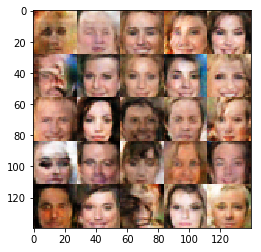

Iter 6111... Discriminator Loss: 0.7310... Generator Loss: 1.5864
Iter 6121... Discriminator Loss: 1.2795... Generator Loss: 2.2537
Iter 6131... Discriminator Loss: 0.9120... Generator Loss: 1.2166
Iter 6141... Discriminator Loss: 0.7629... Generator Loss: 2.1115
Iter 6151... Discriminator Loss: 0.9035... Generator Loss: 1.3944
Iter 6161... Discriminator Loss: 0.7497... Generator Loss: 1.3527
Iter 6171... Discriminator Loss: 0.7575... Generator Loss: 1.7935
Iter 6181... Discriminator Loss: 1.2053... Generator Loss: 2.3795
Iter 6191... Discriminator Loss: 0.8799... Generator Loss: 1.2322
Iter 6201... Discriminator Loss: 1.0549... Generator Loss: 1.8188


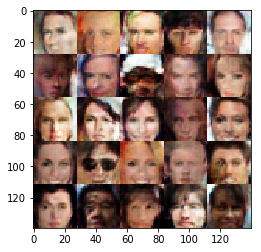

Iter 6211... Discriminator Loss: 1.1295... Generator Loss: 0.7690
Iter 6221... Discriminator Loss: 0.9067... Generator Loss: 1.0738
Iter 6231... Discriminator Loss: 0.8707... Generator Loss: 0.8951
Iter 6241... Discriminator Loss: 1.1765... Generator Loss: 0.6465
Iter 6251... Discriminator Loss: 1.2531... Generator Loss: 0.4475
Iter 6261... Discriminator Loss: 0.8729... Generator Loss: 1.3171
Iter 6271... Discriminator Loss: 1.1818... Generator Loss: 1.2517
Iter 6281... Discriminator Loss: 1.1055... Generator Loss: 3.0108
Iter 6291... Discriminator Loss: 1.0097... Generator Loss: 1.6555
Iter 6301... Discriminator Loss: 0.9155... Generator Loss: 1.2481


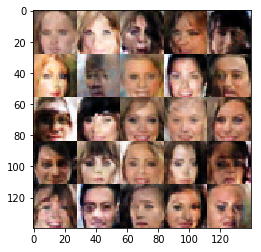

Iter 6311... Discriminator Loss: 1.0276... Generator Loss: 0.8112
Iter 6321... Discriminator Loss: 1.3479... Generator Loss: 0.8430
Iter 6331... Discriminator Loss: 0.7784... Generator Loss: 1.3877
Iter 6341... Discriminator Loss: 1.3171... Generator Loss: 0.8031
Iter 6351... Discriminator Loss: 1.0135... Generator Loss: 1.4265
Iter 6361... Discriminator Loss: 1.2557... Generator Loss: 0.6437
Iter 6371... Discriminator Loss: 1.1603... Generator Loss: 0.7779
Iter 6381... Discriminator Loss: 0.8092... Generator Loss: 2.6363
Iter 6391... Discriminator Loss: 1.2153... Generator Loss: 0.9346
Iter 6401... Discriminator Loss: 0.7958... Generator Loss: 1.4833


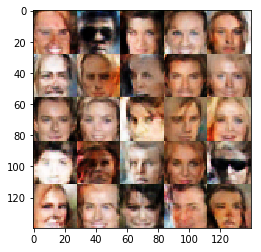

Iter 6411... Discriminator Loss: 0.9453... Generator Loss: 1.4664
Iter 6421... Discriminator Loss: 0.7279... Generator Loss: 1.3900
Iter 6431... Discriminator Loss: 0.7445... Generator Loss: 1.3939
Iter 6441... Discriminator Loss: 1.0537... Generator Loss: 0.9406
Iter 6451... Discriminator Loss: 1.0097... Generator Loss: 1.8160
Iter 6461... Discriminator Loss: 1.6147... Generator Loss: 0.5221
Iter 6471... Discriminator Loss: 0.7724... Generator Loss: 2.2319
Iter 6481... Discriminator Loss: 0.7563... Generator Loss: 2.4170
Iter 6491... Discriminator Loss: 0.8822... Generator Loss: 1.1870
Iter 6501... Discriminator Loss: 1.0670... Generator Loss: 2.2784


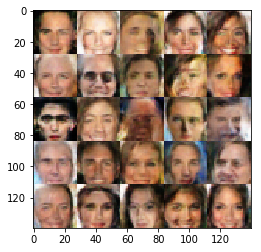

Iter 6511... Discriminator Loss: 0.9375... Generator Loss: 1.0224
Iter 6521... Discriminator Loss: 1.1588... Generator Loss: 1.5523
Iter 6531... Discriminator Loss: 1.0033... Generator Loss: 0.9835
Iter 6541... Discriminator Loss: 1.3278... Generator Loss: 0.6532
Iter 6551... Discriminator Loss: 0.8041... Generator Loss: 1.4017
Iter 6561... Discriminator Loss: 0.8863... Generator Loss: 1.6546
Iter 6571... Discriminator Loss: 0.8256... Generator Loss: 1.7030
Iter 6581... Discriminator Loss: 1.2573... Generator Loss: 0.5944
Iter 6591... Discriminator Loss: 0.7959... Generator Loss: 2.3626
Iter 6601... Discriminator Loss: 1.2222... Generator Loss: 0.7495


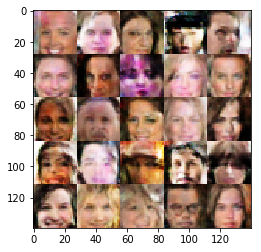

Iter 6611... Discriminator Loss: 1.2573... Generator Loss: 0.9042
Iter 6621... Discriminator Loss: 1.1828... Generator Loss: 0.6674
Iter 6631... Discriminator Loss: 1.0265... Generator Loss: 1.0031
Iter 6641... Discriminator Loss: 0.7003... Generator Loss: 1.8770
Iter 6651... Discriminator Loss: 1.0381... Generator Loss: 0.9806
Iter 6661... Discriminator Loss: 1.1970... Generator Loss: 0.5922
Iter 6671... Discriminator Loss: 1.3434... Generator Loss: 0.6217
Iter 6681... Discriminator Loss: 1.0992... Generator Loss: 0.7963
Iter 6691... Discriminator Loss: 1.2010... Generator Loss: 0.9020
Iter 6701... Discriminator Loss: 1.0095... Generator Loss: 1.1034


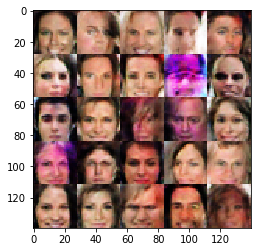

Iter 6711... Discriminator Loss: 0.9821... Generator Loss: 1.1751
Iter 6721... Discriminator Loss: 0.8909... Generator Loss: 1.2618
Iter 6731... Discriminator Loss: 0.8579... Generator Loss: 1.2860
Iter 6741... Discriminator Loss: 1.0225... Generator Loss: 1.2206
Iter 6751... Discriminator Loss: 0.9672... Generator Loss: 0.8786
Iter 6761... Discriminator Loss: 0.8733... Generator Loss: 1.6109
Iter 6771... Discriminator Loss: 0.9848... Generator Loss: 1.0685
Iter 6781... Discriminator Loss: 0.8016... Generator Loss: 2.7389
Iter 6791... Discriminator Loss: 1.2548... Generator Loss: 0.6240
Iter 6801... Discriminator Loss: 1.0247... Generator Loss: 0.7990


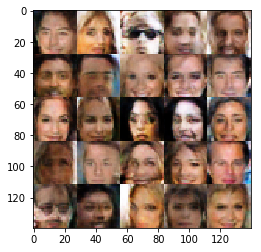

Iter 6811... Discriminator Loss: 0.8068... Generator Loss: 2.4396
Iter 6821... Discriminator Loss: 0.8096... Generator Loss: 1.4752
Iter 6831... Discriminator Loss: 0.9906... Generator Loss: 1.0570
Iter 6841... Discriminator Loss: 0.7902... Generator Loss: 1.8949
Iter 6851... Discriminator Loss: 0.6742... Generator Loss: 1.9085
Iter 6861... Discriminator Loss: 0.7943... Generator Loss: 1.2755
Iter 6871... Discriminator Loss: 0.7957... Generator Loss: 1.3281
Iter 6881... Discriminator Loss: 1.2281... Generator Loss: 0.6393
Iter 6891... Discriminator Loss: 0.7715... Generator Loss: 1.4133
Iter 6901... Discriminator Loss: 0.6970... Generator Loss: 2.2463


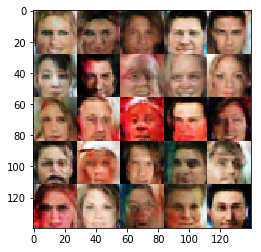

Iter 6911... Discriminator Loss: 1.3170... Generator Loss: 1.0026
Iter 6921... Discriminator Loss: 1.5499... Generator Loss: 0.6135
Iter 6931... Discriminator Loss: 0.8111... Generator Loss: 2.2385
Iter 6941... Discriminator Loss: 0.9251... Generator Loss: 1.2672
Iter 6951... Discriminator Loss: 1.0306... Generator Loss: 0.8697
Iter 6961... Discriminator Loss: 1.1997... Generator Loss: 0.8977
Iter 6971... Discriminator Loss: 1.4791... Generator Loss: 0.4198
Iter 6981... Discriminator Loss: 0.8554... Generator Loss: 1.5216
Iter 6991... Discriminator Loss: 0.7062... Generator Loss: 1.4362
Iter 7001... Discriminator Loss: 1.3975... Generator Loss: 0.4995


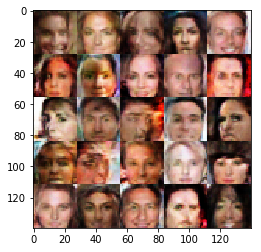

Iter 7011... Discriminator Loss: 1.0368... Generator Loss: 1.0249
Iter 7021... Discriminator Loss: 0.9481... Generator Loss: 1.3148
Iter 7031... Discriminator Loss: 1.3897... Generator Loss: 0.8237
Iter 7041... Discriminator Loss: 0.7829... Generator Loss: 2.0763
Iter 7051... Discriminator Loss: 0.7612... Generator Loss: 2.3212
Iter 7061... Discriminator Loss: 0.6666... Generator Loss: 1.7651
Iter 7071... Discriminator Loss: 0.5591... Generator Loss: 2.5869
Iter 7081... Discriminator Loss: 0.5851... Generator Loss: 2.6552
Iter 7091... Discriminator Loss: 1.2736... Generator Loss: 0.7959
Iter 7101... Discriminator Loss: 0.7167... Generator Loss: 1.6163


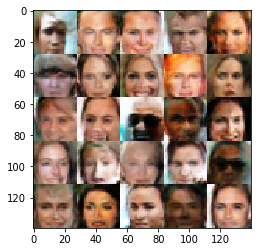

Iter 7111... Discriminator Loss: 0.8910... Generator Loss: 0.8537
Iter 7121... Discriminator Loss: 1.3822... Generator Loss: 0.4787
Iter 7131... Discriminator Loss: 0.7357... Generator Loss: 2.5181
Iter 7141... Discriminator Loss: 1.4157... Generator Loss: 0.4027
Iter 7151... Discriminator Loss: 0.8626... Generator Loss: 1.2018
Iter 7161... Discriminator Loss: 0.8685... Generator Loss: 1.1444
Iter 7171... Discriminator Loss: 1.0523... Generator Loss: 1.4208
Iter 7181... Discriminator Loss: 1.0241... Generator Loss: 0.9373
Iter 7191... Discriminator Loss: 1.2351... Generator Loss: 0.6977
Iter 7201... Discriminator Loss: 0.7245... Generator Loss: 2.2726


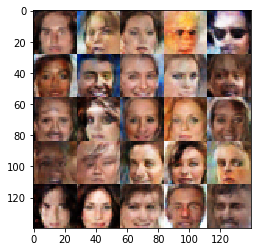

Iter 7211... Discriminator Loss: 0.7346... Generator Loss: 2.0171
Iter 7221... Discriminator Loss: 0.8903... Generator Loss: 3.1970
Iter 7231... Discriminator Loss: 0.9511... Generator Loss: 1.0411
Iter 7241... Discriminator Loss: 1.3252... Generator Loss: 0.7970
Iter 7251... Discriminator Loss: 0.8976... Generator Loss: 1.6753
Iter 7261... Discriminator Loss: 0.7239... Generator Loss: 1.4616
Iter 7271... Discriminator Loss: 0.8597... Generator Loss: 1.2879
Iter 7281... Discriminator Loss: 1.1820... Generator Loss: 1.2838
Iter 7291... Discriminator Loss: 0.9869... Generator Loss: 1.0508
Iter 7301... Discriminator Loss: 0.9391... Generator Loss: 0.9937


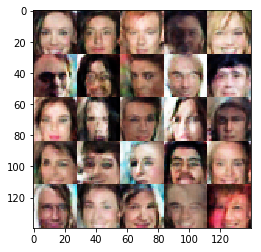

Iter 7311... Discriminator Loss: 0.8932... Generator Loss: 1.4160
Iter 7321... Discriminator Loss: 1.6044... Generator Loss: 0.6182
Iter 7331... Discriminator Loss: 1.4777... Generator Loss: 0.6165
Iter 7341... Discriminator Loss: 0.8959... Generator Loss: 1.8846
Iter 7351... Discriminator Loss: 1.0431... Generator Loss: 2.0122
Iter 7361... Discriminator Loss: 1.4533... Generator Loss: 0.5661
Iter 7371... Discriminator Loss: 0.8363... Generator Loss: 1.0942
Iter 7381... Discriminator Loss: 1.1526... Generator Loss: 0.8460
Iter 7391... Discriminator Loss: 0.9764... Generator Loss: 1.7159
Iter 7401... Discriminator Loss: 0.8212... Generator Loss: 1.3779


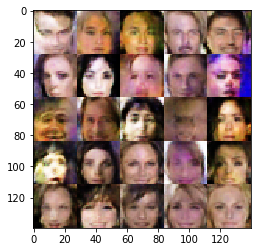

Iter 7411... Discriminator Loss: 0.9556... Generator Loss: 1.3540
Iter 7421... Discriminator Loss: 1.6123... Generator Loss: 0.8768
Iter 7431... Discriminator Loss: 0.8893... Generator Loss: 1.3009
Iter 7441... Discriminator Loss: 1.0263... Generator Loss: 1.1955
Iter 7451... Discriminator Loss: 1.7454... Generator Loss: 0.5155
Iter 7461... Discriminator Loss: 1.0614... Generator Loss: 1.0662
Iter 7471... Discriminator Loss: 0.9676... Generator Loss: 1.4062
Iter 7481... Discriminator Loss: 0.7450... Generator Loss: 1.4621
Iter 7491... Discriminator Loss: 1.1410... Generator Loss: 0.9355
Iter 7501... Discriminator Loss: 1.4982... Generator Loss: 0.5790


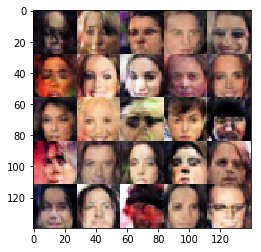

Iter 7511... Discriminator Loss: 0.9657... Generator Loss: 0.9541
Iter 7521... Discriminator Loss: 1.2826... Generator Loss: 0.8030
Iter 7531... Discriminator Loss: 0.9761... Generator Loss: 0.8227
Iter 7541... Discriminator Loss: 0.9408... Generator Loss: 1.8565
Iter 7551... Discriminator Loss: 0.8510... Generator Loss: 1.3246
Iter 7561... Discriminator Loss: 0.6990... Generator Loss: 2.8684
Iter 7571... Discriminator Loss: 0.8314... Generator Loss: 1.2730
Iter 7581... Discriminator Loss: 0.7865... Generator Loss: 2.4585
Iter 7591... Discriminator Loss: 0.6927... Generator Loss: 2.5870
Iter 7601... Discriminator Loss: 0.9514... Generator Loss: 0.7163


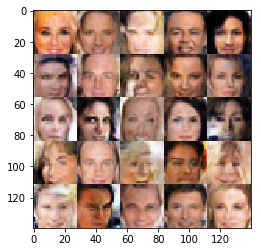

Iter 7611... Discriminator Loss: 1.0795... Generator Loss: 1.0577
Iter 7621... Discriminator Loss: 1.1849... Generator Loss: 0.4637
Iter 7631... Discriminator Loss: 0.7741... Generator Loss: 1.4703
Iter 7641... Discriminator Loss: 0.9100... Generator Loss: 0.9963
Iter 7651... Discriminator Loss: 0.9278... Generator Loss: 1.7032
Iter 7661... Discriminator Loss: 1.4803... Generator Loss: 0.6696
Iter 7671... Discriminator Loss: 0.8487... Generator Loss: 1.1091
Iter 7681... Discriminator Loss: 1.1484... Generator Loss: 1.1720
Iter 7691... Discriminator Loss: 1.1344... Generator Loss: 0.9812
Iter 7701... Discriminator Loss: 1.3028... Generator Loss: 0.6132


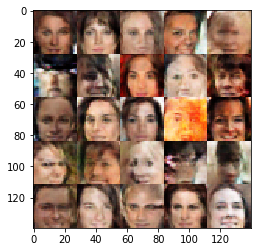

Iter 7711... Discriminator Loss: 1.0290... Generator Loss: 1.1026
Iter 7721... Discriminator Loss: 0.8948... Generator Loss: 1.2893
Iter 7731... Discriminator Loss: 1.0406... Generator Loss: 1.2734
Iter 7741... Discriminator Loss: 1.0767... Generator Loss: 0.7318
Iter 7751... Discriminator Loss: 1.2234... Generator Loss: 0.4806
Iter 7761... Discriminator Loss: 0.6714... Generator Loss: 2.0110
Iter 7771... Discriminator Loss: 0.6478... Generator Loss: 1.1627
Iter 7781... Discriminator Loss: 1.2337... Generator Loss: 0.5970
Iter 7791... Discriminator Loss: 0.7997... Generator Loss: 1.2716
Iter 7801... Discriminator Loss: 1.0385... Generator Loss: 0.8273


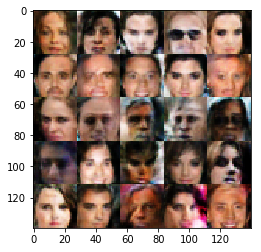

Iter 7811... Discriminator Loss: 1.4370... Generator Loss: 0.7725
Iter 7821... Discriminator Loss: 0.9256... Generator Loss: 1.3994
Iter 7831... Discriminator Loss: 0.7986... Generator Loss: 2.0765
Iter 7841... Discriminator Loss: 0.8440... Generator Loss: 2.4894
Iter 7851... Discriminator Loss: 0.9543... Generator Loss: 1.0429
Iter 7861... Discriminator Loss: 0.9408... Generator Loss: 1.1909
Iter 7871... Discriminator Loss: 0.7636... Generator Loss: 1.3377
Iter 7881... Discriminator Loss: 1.1035... Generator Loss: 0.9059
Iter 7891... Discriminator Loss: 1.1513... Generator Loss: 0.7889
Iter 7901... Discriminator Loss: 0.8479... Generator Loss: 0.7382


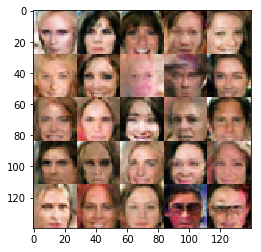

Iter 7911... Discriminator Loss: 1.1053... Generator Loss: 1.2324
Iter 7921... Discriminator Loss: 0.7344... Generator Loss: 2.0062
Iter 7931... Discriminator Loss: 0.8732... Generator Loss: 1.0291
Iter 7941... Discriminator Loss: 0.9105... Generator Loss: 0.8275
Iter 7951... Discriminator Loss: 0.8827... Generator Loss: 1.5071
Iter 7961... Discriminator Loss: 0.6963... Generator Loss: 1.3864
Iter 7971... Discriminator Loss: 0.8306... Generator Loss: 1.4629
Iter 7981... Discriminator Loss: 1.3187... Generator Loss: 0.9316
Iter 7991... Discriminator Loss: 0.9578... Generator Loss: 1.6003
Iter 8001... Discriminator Loss: 1.1620... Generator Loss: 1.0379


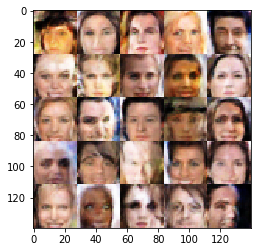

Iter 8011... Discriminator Loss: 0.7726... Generator Loss: 2.2195
Iter 8021... Discriminator Loss: 1.2026... Generator Loss: 0.8358
Iter 8031... Discriminator Loss: 1.0121... Generator Loss: 0.9949
Iter 8041... Discriminator Loss: 1.6932... Generator Loss: 0.4283
Iter 8051... Discriminator Loss: 1.0398... Generator Loss: 0.6201
Iter 8061... Discriminator Loss: 1.1143... Generator Loss: 1.0246
Iter 8071... Discriminator Loss: 0.9073... Generator Loss: 1.4215
Iter 8081... Discriminator Loss: 1.2202... Generator Loss: 1.2310
Iter 8091... Discriminator Loss: 0.8236... Generator Loss: 2.1678
Iter 8101... Discriminator Loss: 0.9874... Generator Loss: 1.4486


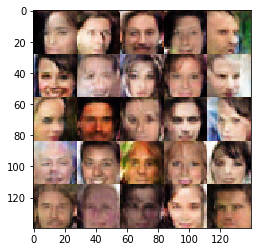

Iter 8111... Discriminator Loss: 1.2784... Generator Loss: 1.1349
Iter 8121... Discriminator Loss: 0.9054... Generator Loss: 2.8735
Iter 8131... Discriminator Loss: 0.8863... Generator Loss: 1.0385
Iter 8141... Discriminator Loss: 1.5150... Generator Loss: 0.8654
Iter 8151... Discriminator Loss: 0.7933... Generator Loss: 1.6996
Iter 8161... Discriminator Loss: 0.5455... Generator Loss: 2.1552
Iter 8171... Discriminator Loss: 1.3127... Generator Loss: 0.7530
Iter 8181... Discriminator Loss: 1.0402... Generator Loss: 0.8550
Iter 8191... Discriminator Loss: 0.8541... Generator Loss: 1.3929
Iter 8201... Discriminator Loss: 0.9400... Generator Loss: 0.9986


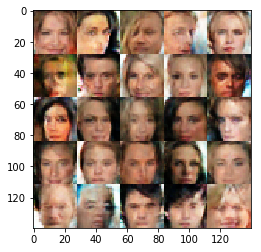

Iter 8211... Discriminator Loss: 0.8243... Generator Loss: 1.8134
Iter 8221... Discriminator Loss: 0.9805... Generator Loss: 0.8642
Iter 8231... Discriminator Loss: 1.5712... Generator Loss: 0.7285
Iter 8241... Discriminator Loss: 0.8375... Generator Loss: 3.1418
Iter 8251... Discriminator Loss: 0.8234... Generator Loss: 1.4057
Iter 8261... Discriminator Loss: 0.7342... Generator Loss: 2.6660
Iter 8271... Discriminator Loss: 0.8390... Generator Loss: 1.9726
Iter 8281... Discriminator Loss: 0.9627... Generator Loss: 0.9951
Iter 8291... Discriminator Loss: 1.1822... Generator Loss: 1.5011
Iter 8301... Discriminator Loss: 0.9139... Generator Loss: 2.1642


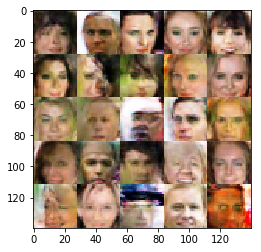

Iter 8311... Discriminator Loss: 1.2384... Generator Loss: 1.1288
Iter 8321... Discriminator Loss: 1.2328... Generator Loss: 0.5846
Iter 8331... Discriminator Loss: 1.1727... Generator Loss: 0.7122
Iter 8341... Discriminator Loss: 0.8114... Generator Loss: 1.6611
Iter 8351... Discriminator Loss: 0.6957... Generator Loss: 2.0260
Iter 8361... Discriminator Loss: 1.6753... Generator Loss: 0.6044
Iter 8371... Discriminator Loss: 2.0727... Generator Loss: 0.5954
Iter 8381... Discriminator Loss: 0.9815... Generator Loss: 1.1330
Iter 8391... Discriminator Loss: 1.1015... Generator Loss: 0.8867
Iter 8401... Discriminator Loss: 0.7166... Generator Loss: 1.3681


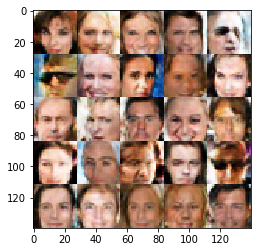

Iter 8411... Discriminator Loss: 0.9003... Generator Loss: 1.1929
Iter 8421... Discriminator Loss: 0.8667... Generator Loss: 1.8629
Iter 8431... Discriminator Loss: 1.4884... Generator Loss: 0.4840
Iter 8441... Discriminator Loss: 0.7709... Generator Loss: 1.8617
Iter 8451... Discriminator Loss: 0.7081... Generator Loss: 1.8190
Iter 8461... Discriminator Loss: 0.9915... Generator Loss: 0.8186
Iter 8471... Discriminator Loss: 0.8817... Generator Loss: 1.5449
Iter 8481... Discriminator Loss: 0.5322... Generator Loss: 2.1383
Iter 8491... Discriminator Loss: 1.3369... Generator Loss: 0.8452
Iter 8501... Discriminator Loss: 1.4990... Generator Loss: 0.9616


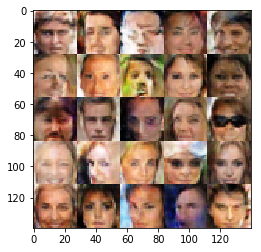

Iter 8511... Discriminator Loss: 1.2072... Generator Loss: 0.7923
Iter 8521... Discriminator Loss: 1.0797... Generator Loss: 1.2387
Iter 8531... Discriminator Loss: 0.9208... Generator Loss: 0.9199
Iter 8541... Discriminator Loss: 0.9488... Generator Loss: 1.9950
Iter 8551... Discriminator Loss: 0.9956... Generator Loss: 0.9782
Iter 8561... Discriminator Loss: 0.8176... Generator Loss: 1.5518
Iter 8571... Discriminator Loss: 0.7876... Generator Loss: 1.0098
Iter 8581... Discriminator Loss: 0.9620... Generator Loss: 1.3967
Iter 8591... Discriminator Loss: 0.8926... Generator Loss: 1.2895
Iter 8601... Discriminator Loss: 1.1309... Generator Loss: 1.0611


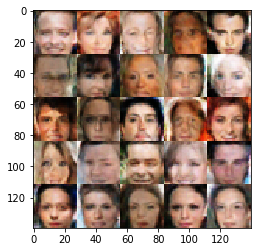

Iter 8611... Discriminator Loss: 1.0685... Generator Loss: 0.9871
Iter 8621... Discriminator Loss: 1.2783... Generator Loss: 0.9191
Iter 8631... Discriminator Loss: 1.0451... Generator Loss: 0.9623
Iter 8641... Discriminator Loss: 0.9081... Generator Loss: 1.5744
Iter 8651... Discriminator Loss: 1.4609... Generator Loss: 0.6619
Iter 8661... Discriminator Loss: 0.8528... Generator Loss: 1.4168
Iter 8671... Discriminator Loss: 1.2405... Generator Loss: 0.7918
Iter 8681... Discriminator Loss: 0.8862... Generator Loss: 1.2087
Iter 8691... Discriminator Loss: 0.7614... Generator Loss: 1.6343
Iter 8701... Discriminator Loss: 1.4723... Generator Loss: 0.5929


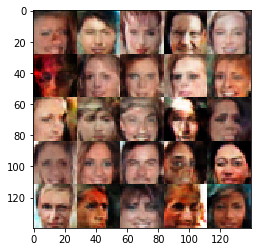

Iter 8711... Discriminator Loss: 0.7691... Generator Loss: 1.7526
Iter 8721... Discriminator Loss: 1.6302... Generator Loss: 0.3640
Iter 8731... Discriminator Loss: 1.2929... Generator Loss: 0.5656
Iter 8741... Discriminator Loss: 1.0579... Generator Loss: 0.6212
Iter 8751... Discriminator Loss: 0.9928... Generator Loss: 0.7491
Iter 8761... Discriminator Loss: 1.1508... Generator Loss: 1.0565
Iter 8771... Discriminator Loss: 0.9538... Generator Loss: 2.3853
Iter 8781... Discriminator Loss: 1.4121... Generator Loss: 0.4679
Iter 8791... Discriminator Loss: 1.2367... Generator Loss: 0.6245
Iter 8801... Discriminator Loss: 0.8934... Generator Loss: 1.5655


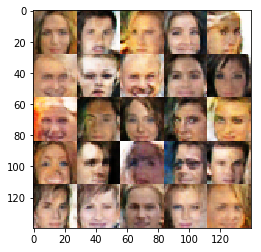

Iter 8811... Discriminator Loss: 0.8946... Generator Loss: 1.1330
Iter 8821... Discriminator Loss: 1.1640... Generator Loss: 0.5607
Iter 8831... Discriminator Loss: 1.1804... Generator Loss: 0.4839
Iter 8841... Discriminator Loss: 0.7655... Generator Loss: 1.0588
Iter 8851... Discriminator Loss: 1.2360... Generator Loss: 2.3929
Iter 8861... Discriminator Loss: 0.8227... Generator Loss: 1.3946
Iter 8871... Discriminator Loss: 1.2854... Generator Loss: 0.6071
Iter 8881... Discriminator Loss: 0.8426... Generator Loss: 1.4406
Iter 8891... Discriminator Loss: 0.9107... Generator Loss: 0.9007
Iter 8901... Discriminator Loss: 0.8340... Generator Loss: 2.4241


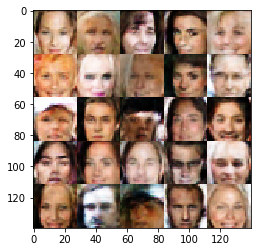

Iter 8911... Discriminator Loss: 0.8187... Generator Loss: 1.8627
Iter 8921... Discriminator Loss: 0.5489... Generator Loss: 1.7952
Iter 8931... Discriminator Loss: 0.7733... Generator Loss: 1.6902
Iter 8941... Discriminator Loss: 1.6971... Generator Loss: 0.2847
Iter 8951... Discriminator Loss: 1.1611... Generator Loss: 0.9053
Iter 8961... Discriminator Loss: 0.8602... Generator Loss: 1.6890
Iter 8971... Discriminator Loss: 1.0272... Generator Loss: 0.6932
Iter 8981... Discriminator Loss: 0.7885... Generator Loss: 1.5634
Iter 8991... Discriminator Loss: 0.9408... Generator Loss: 1.5363
Iter 9001... Discriminator Loss: 2.0552... Generator Loss: 0.5117


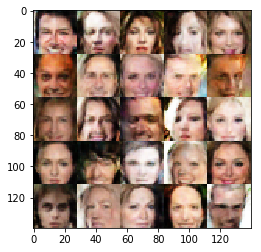

Iter 9011... Discriminator Loss: 1.1090... Generator Loss: 2.8123
Iter 9021... Discriminator Loss: 1.0898... Generator Loss: 1.0875
Iter 9031... Discriminator Loss: 1.2844... Generator Loss: 2.5460
Iter 9041... Discriminator Loss: 0.8197... Generator Loss: 1.2050
Iter 9051... Discriminator Loss: 0.9200... Generator Loss: 1.2888
Iter 9061... Discriminator Loss: 0.7289... Generator Loss: 1.7000
Iter 9071... Discriminator Loss: 1.0037... Generator Loss: 1.1149
Iter 9081... Discriminator Loss: 0.9431... Generator Loss: 1.0692
Iter 9091... Discriminator Loss: 0.6033... Generator Loss: 1.9238
Iter 9101... Discriminator Loss: 1.3743... Generator Loss: 0.8660


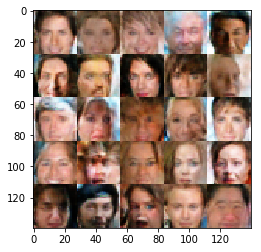

Iter 9111... Discriminator Loss: 0.8748... Generator Loss: 1.3389
Iter 9121... Discriminator Loss: 1.2263... Generator Loss: 0.9784
Iter 9131... Discriminator Loss: 1.2958... Generator Loss: 3.5223
Iter 9141... Discriminator Loss: 0.6329... Generator Loss: 1.9731
Iter 9151... Discriminator Loss: 1.0095... Generator Loss: 0.9660
Iter 9161... Discriminator Loss: 0.9463... Generator Loss: 1.3945
Iter 9171... Discriminator Loss: 0.8315... Generator Loss: 1.8028
Iter 9181... Discriminator Loss: 0.8776... Generator Loss: 1.2810
Iter 9191... Discriminator Loss: 1.0411... Generator Loss: 1.3186
Iter 9201... Discriminator Loss: 1.4299... Generator Loss: 0.5535


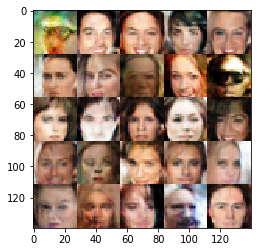

Iter 9211... Discriminator Loss: 0.6904... Generator Loss: 1.4793
Iter 9221... Discriminator Loss: 0.9755... Generator Loss: 1.2916
Iter 9231... Discriminator Loss: 0.9520... Generator Loss: 1.3100
Iter 9241... Discriminator Loss: 1.1027... Generator Loss: 1.4501
Iter 9251... Discriminator Loss: 1.1286... Generator Loss: 0.8744
Iter 9261... Discriminator Loss: 0.9882... Generator Loss: 0.7902
Iter 9271... Discriminator Loss: 0.8960... Generator Loss: 1.3798
Iter 9281... Discriminator Loss: 0.9917... Generator Loss: 3.2090
Iter 9291... Discriminator Loss: 0.7841... Generator Loss: 1.4676
Iter 9301... Discriminator Loss: 0.9354... Generator Loss: 2.2136


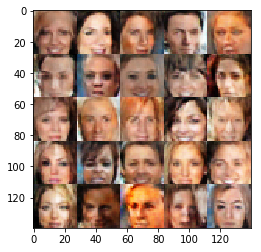

Iter 9311... Discriminator Loss: 0.7925... Generator Loss: 1.9190
Iter 9321... Discriminator Loss: 0.5091... Generator Loss: 1.9690
Iter 9331... Discriminator Loss: 0.6292... Generator Loss: 1.7663
Iter 9341... Discriminator Loss: 0.7209... Generator Loss: 2.0549
Iter 9351... Discriminator Loss: 1.1793... Generator Loss: 0.6381
Iter 9361... Discriminator Loss: 0.5234... Generator Loss: 3.0596
Iter 9371... Discriminator Loss: 0.8304... Generator Loss: 1.2230
Iter 9381... Discriminator Loss: 0.8976... Generator Loss: 1.8202
Iter 9391... Discriminator Loss: 1.4599... Generator Loss: 3.5340
Iter 9401... Discriminator Loss: 1.1281... Generator Loss: 0.7752


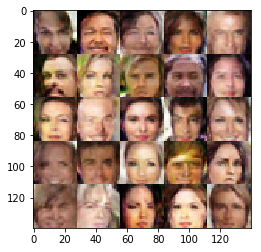

Iter 9411... Discriminator Loss: 1.3831... Generator Loss: 0.8205
Iter 9421... Discriminator Loss: 0.8053... Generator Loss: 1.9826
Iter 9431... Discriminator Loss: 1.2256... Generator Loss: 0.7826
Iter 9441... Discriminator Loss: 0.8907... Generator Loss: 0.8558
Iter 9451... Discriminator Loss: 0.8680... Generator Loss: 1.5899
Iter 9461... Discriminator Loss: 1.1596... Generator Loss: 0.7628
Iter 9471... Discriminator Loss: 0.8807... Generator Loss: 1.1433
Iter 9481... Discriminator Loss: 0.5215... Generator Loss: 2.3104
Iter 9491... Discriminator Loss: 0.7021... Generator Loss: 1.6412
Iter 9501... Discriminator Loss: 0.8090... Generator Loss: 1.7113


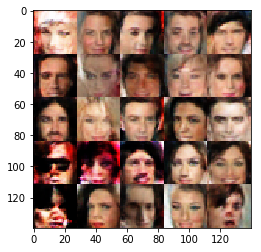

Iter 9511... Discriminator Loss: 0.8142... Generator Loss: 2.0869
Iter 9521... Discriminator Loss: 0.9681... Generator Loss: 0.9476
Iter 9531... Discriminator Loss: 0.7103... Generator Loss: 1.6184
Iter 9541... Discriminator Loss: 0.6440... Generator Loss: 2.3711
Iter 9551... Discriminator Loss: 0.7926... Generator Loss: 1.7519
Iter 9561... Discriminator Loss: 1.1840... Generator Loss: 0.6702
Iter 9571... Discriminator Loss: 0.9127... Generator Loss: 1.4259
Iter 9581... Discriminator Loss: 0.8178... Generator Loss: 1.3691
Iter 9591... Discriminator Loss: 0.9049... Generator Loss: 0.9633
Iter 9601... Discriminator Loss: 0.8609... Generator Loss: 1.2396


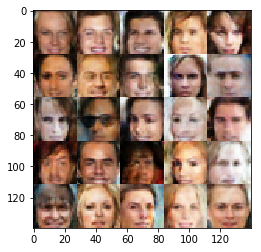

Iter 9611... Discriminator Loss: 0.8887... Generator Loss: 1.3188
Iter 9621... Discriminator Loss: 0.8868... Generator Loss: 1.3111
Iter 9631... Discriminator Loss: 0.7082... Generator Loss: 1.2027
Iter 9641... Discriminator Loss: 0.8977... Generator Loss: 1.1269
Iter 9651... Discriminator Loss: 0.6565... Generator Loss: 1.8508
Iter 9661... Discriminator Loss: 0.7585... Generator Loss: 1.9289
Iter 9671... Discriminator Loss: 1.2008... Generator Loss: 0.7707
Iter 9681... Discriminator Loss: 0.9254... Generator Loss: 1.0622
Iter 9691... Discriminator Loss: 0.7050... Generator Loss: 2.3968
Iter 9701... Discriminator Loss: 0.9861... Generator Loss: 1.4804


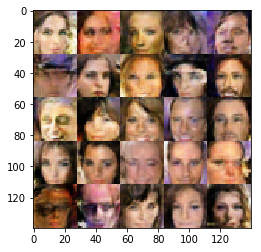

Iter 9711... Discriminator Loss: 0.6657... Generator Loss: 1.9886
Iter 9721... Discriminator Loss: 1.2016... Generator Loss: 0.6311
Iter 9731... Discriminator Loss: 0.7724... Generator Loss: 1.4422
Iter 9741... Discriminator Loss: 1.1779... Generator Loss: 1.2181
Iter 9751... Discriminator Loss: 1.1982... Generator Loss: 2.7377
Iter 9761... Discriminator Loss: 0.9401... Generator Loss: 1.6520
Iter 9771... Discriminator Loss: 1.0232... Generator Loss: 1.1557
Iter 9781... Discriminator Loss: 1.0105... Generator Loss: 0.8508
Iter 9791... Discriminator Loss: 1.1744... Generator Loss: 0.8386
Iter 9801... Discriminator Loss: 0.8568... Generator Loss: 1.3220


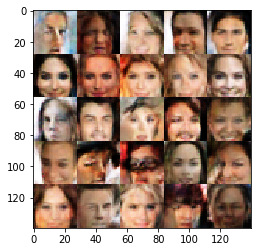

Iter 9811... Discriminator Loss: 0.7780... Generator Loss: 2.7404
Iter 9821... Discriminator Loss: 1.0026... Generator Loss: 1.5298
Iter 9831... Discriminator Loss: 0.6609... Generator Loss: 2.8433
Iter 9841... Discriminator Loss: 0.9717... Generator Loss: 0.9317
Iter 9851... Discriminator Loss: 1.0570... Generator Loss: 0.8118
Iter 9861... Discriminator Loss: 0.7807... Generator Loss: 1.2306
Iter 9871... Discriminator Loss: 0.7886... Generator Loss: 0.6884
Iter 9881... Discriminator Loss: 0.6338... Generator Loss: 2.0479
Iter 9891... Discriminator Loss: 1.0985... Generator Loss: 0.8427
Iter 9901... Discriminator Loss: 0.6716... Generator Loss: 1.9513


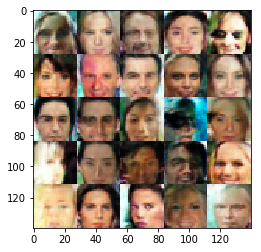

Iter 9911... Discriminator Loss: 0.7015... Generator Loss: 1.7132
Iter 9921... Discriminator Loss: 1.4452... Generator Loss: 0.5125
Iter 9931... Discriminator Loss: 0.8049... Generator Loss: 0.9356
Iter 9941... Discriminator Loss: 1.0896... Generator Loss: 1.5239
Iter 9951... Discriminator Loss: 0.5703... Generator Loss: 2.6589
Iter 9961... Discriminator Loss: 0.7888... Generator Loss: 0.9898
Iter 9971... Discriminator Loss: 0.8223... Generator Loss: 1.3094
Iter 9981... Discriminator Loss: 0.8389... Generator Loss: 1.6746
Iter 9991... Discriminator Loss: 1.0473... Generator Loss: 0.9958
Iter 10001... Discriminator Loss: 0.6770... Generator Loss: 1.6933


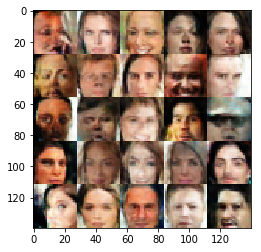

Iter 10011... Discriminator Loss: 0.6834... Generator Loss: 2.0398
Iter 10021... Discriminator Loss: 0.6031... Generator Loss: 2.6883
Iter 10031... Discriminator Loss: 1.0400... Generator Loss: 1.1276
Iter 10041... Discriminator Loss: 1.0301... Generator Loss: 1.1161
Iter 10051... Discriminator Loss: 1.2419... Generator Loss: 0.7809
Iter 10061... Discriminator Loss: 0.7951... Generator Loss: 1.5934
Iter 10071... Discriminator Loss: 0.7671... Generator Loss: 1.6714
Iter 10081... Discriminator Loss: 0.6364... Generator Loss: 2.1766
Iter 10091... Discriminator Loss: 0.9809... Generator Loss: 1.1959
Iter 10101... Discriminator Loss: 1.5291... Generator Loss: 0.5636


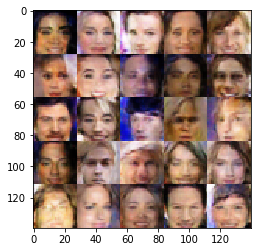

Iter 10111... Discriminator Loss: 0.7445... Generator Loss: 1.2200
Iter 10121... Discriminator Loss: 1.0273... Generator Loss: 1.4590
Iter 10131... Discriminator Loss: 0.7072... Generator Loss: 1.9076
Iter 10141... Discriminator Loss: 0.8331... Generator Loss: 1.5289
Iter 10151... Discriminator Loss: 1.6809... Generator Loss: 0.7896
Iter 10161... Discriminator Loss: 1.1873... Generator Loss: 0.5100
Iter 10171... Discriminator Loss: 1.1900... Generator Loss: 0.9475
Iter 10181... Discriminator Loss: 0.9029... Generator Loss: 1.2539
Iter 10191... Discriminator Loss: 0.9412... Generator Loss: 1.1478
Iter 10201... Discriminator Loss: 1.3321... Generator Loss: 0.6378


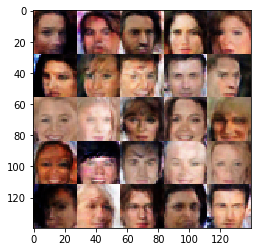

Iter 10211... Discriminator Loss: 1.4177... Generator Loss: 0.6638
Iter 10221... Discriminator Loss: 1.3379... Generator Loss: 1.0544
Iter 10231... Discriminator Loss: 1.2527... Generator Loss: 3.5991
Iter 10241... Discriminator Loss: 0.7929... Generator Loss: 1.6812
Iter 10251... Discriminator Loss: 0.7086... Generator Loss: 1.6393
Iter 10261... Discriminator Loss: 0.9429... Generator Loss: 1.7690
Iter 10271... Discriminator Loss: 1.0508... Generator Loss: 0.7265
Iter 10281... Discriminator Loss: 0.6323... Generator Loss: 2.1245
Iter 10291... Discriminator Loss: 0.6425... Generator Loss: 1.8804
Iter 10301... Discriminator Loss: 0.8475... Generator Loss: 1.1677


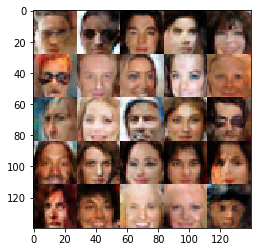

Iter 10311... Discriminator Loss: 1.0877... Generator Loss: 0.9381
Iter 10321... Discriminator Loss: 1.0210... Generator Loss: 0.4792
Iter 10331... Discriminator Loss: 0.6656... Generator Loss: 2.0448
Iter 10341... Discriminator Loss: 0.8625... Generator Loss: 1.8935
Iter 10351... Discriminator Loss: 0.7916... Generator Loss: 1.4631
Iter 10361... Discriminator Loss: 0.7864... Generator Loss: 1.2140
Iter 10371... Discriminator Loss: 0.8925... Generator Loss: 1.0490
Iter 10381... Discriminator Loss: 0.6530... Generator Loss: 1.7762
Iter 10391... Discriminator Loss: 1.1636... Generator Loss: 0.7823
Iter 10401... Discriminator Loss: 0.7146... Generator Loss: 1.2219


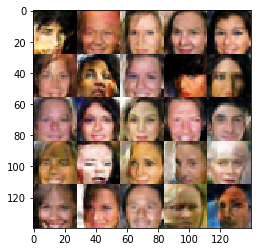

Iter 10411... Discriminator Loss: 1.3211... Generator Loss: 0.7776
Iter 10421... Discriminator Loss: 1.3656... Generator Loss: 0.8395
Iter 10431... Discriminator Loss: 1.4347... Generator Loss: 0.7458
Iter 10441... Discriminator Loss: 0.7425... Generator Loss: 1.3988
Iter 10451... Discriminator Loss: 0.6024... Generator Loss: 1.8961
Iter 10461... Discriminator Loss: 1.1156... Generator Loss: 1.5724
Iter 10471... Discriminator Loss: 0.7126... Generator Loss: 1.9219
Iter 10481... Discriminator Loss: 1.0094... Generator Loss: 1.1736
Iter 10491... Discriminator Loss: 0.8970... Generator Loss: 1.4549
Iter 10501... Discriminator Loss: 0.6604... Generator Loss: 1.4882


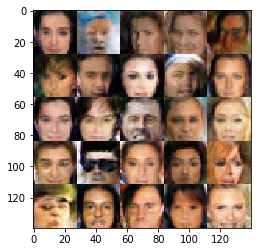

Iter 10511... Discriminator Loss: 0.8181... Generator Loss: 1.3216
Iter 10521... Discriminator Loss: 0.7532... Generator Loss: 1.3437
Iter 10531... Discriminator Loss: 0.9821... Generator Loss: 0.8623
Iter 10541... Discriminator Loss: 0.5948... Generator Loss: 2.3824
Iter 10551... Discriminator Loss: 0.6991... Generator Loss: 2.3346
Iter 10561... Discriminator Loss: 0.6845... Generator Loss: 1.4625
Iter 10571... Discriminator Loss: 0.7258... Generator Loss: 1.3697
Iter 10581... Discriminator Loss: 0.9426... Generator Loss: 1.1944
Iter 10591... Discriminator Loss: 0.9887... Generator Loss: 2.4170
Iter 10601... Discriminator Loss: 0.9485... Generator Loss: 2.1538


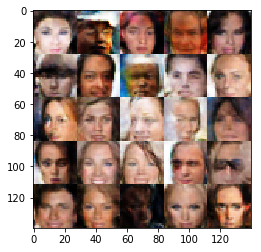

Iter 10611... Discriminator Loss: 0.6449... Generator Loss: 1.4292
Iter 10621... Discriminator Loss: 0.7393... Generator Loss: 2.0832
Iter 10631... Discriminator Loss: 0.7131... Generator Loss: 2.6774
Iter 10641... Discriminator Loss: 0.4901... Generator Loss: 2.2771
Iter 10651... Discriminator Loss: 0.7930... Generator Loss: 2.9099
Iter 10661... Discriminator Loss: 1.3973... Generator Loss: 0.6538
Iter 10671... Discriminator Loss: 1.3763... Generator Loss: 0.6841
Iter 10681... Discriminator Loss: 1.4723... Generator Loss: 0.5644
Iter 10691... Discriminator Loss: 1.1486... Generator Loss: 0.9526
Iter 10701... Discriminator Loss: 0.5052... Generator Loss: 1.8720


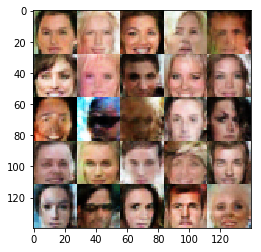

Iter 10711... Discriminator Loss: 0.8220... Generator Loss: 1.6507
Iter 10721... Discriminator Loss: 0.8986... Generator Loss: 0.8929
Iter 10731... Discriminator Loss: 0.7637... Generator Loss: 1.9167
Iter 10741... Discriminator Loss: 0.8760... Generator Loss: 1.7891
Iter 10751... Discriminator Loss: 0.6810... Generator Loss: 1.8755
Iter 10761... Discriminator Loss: 1.1861... Generator Loss: 0.9986
Iter 10771... Discriminator Loss: 0.7228... Generator Loss: 2.1699
Iter 10781... Discriminator Loss: 0.4522... Generator Loss: 2.7883
Iter 10791... Discriminator Loss: 0.7334... Generator Loss: 1.6889
Iter 10801... Discriminator Loss: 0.7334... Generator Loss: 1.2053


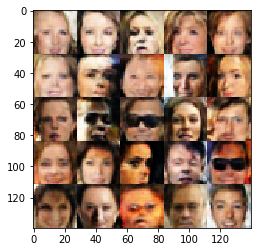

Iter 10811... Discriminator Loss: 0.5698... Generator Loss: 1.8289
Iter 10821... Discriminator Loss: 1.8481... Generator Loss: 0.3354
Iter 10831... Discriminator Loss: 0.7523... Generator Loss: 1.1079
Iter 10841... Discriminator Loss: 0.7558... Generator Loss: 2.7787
Iter 10851... Discriminator Loss: 0.7245... Generator Loss: 2.2354
Iter 10861... Discriminator Loss: 0.7614... Generator Loss: 1.8600
Iter 10871... Discriminator Loss: 0.6009... Generator Loss: 2.0440
Iter 10881... Discriminator Loss: 0.8046... Generator Loss: 1.5196
Iter 10891... Discriminator Loss: 0.8527... Generator Loss: 1.4715
Iter 10901... Discriminator Loss: 0.9041... Generator Loss: 1.5669


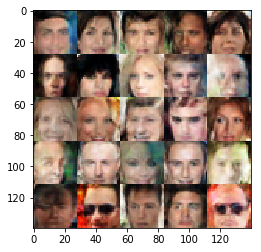

Iter 10911... Discriminator Loss: 1.0293... Generator Loss: 1.1593
Iter 10921... Discriminator Loss: 0.6473... Generator Loss: 1.7302
Iter 10931... Discriminator Loss: 0.4957... Generator Loss: 2.5023
Iter 10941... Discriminator Loss: 0.7557... Generator Loss: 2.5795
Iter 10951... Discriminator Loss: 1.1330... Generator Loss: 0.9058
Iter 10961... Discriminator Loss: 0.6222... Generator Loss: 2.4693
Iter 10971... Discriminator Loss: 0.5985... Generator Loss: 1.9294
Iter 10981... Discriminator Loss: 0.8853... Generator Loss: 1.0612
Iter 10991... Discriminator Loss: 1.2550... Generator Loss: 0.7701
Iter 11001... Discriminator Loss: 0.5392... Generator Loss: 3.3339


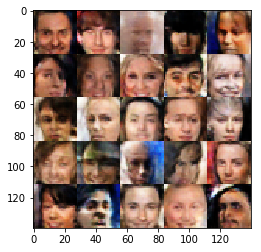

Iter 11011... Discriminator Loss: 1.3167... Generator Loss: 0.5506
Iter 11021... Discriminator Loss: 1.0909... Generator Loss: 1.0570
Iter 11031... Discriminator Loss: 0.9140... Generator Loss: 1.7375
Iter 11041... Discriminator Loss: 0.6685... Generator Loss: 1.6998
Iter 11051... Discriminator Loss: 1.0228... Generator Loss: 1.7334
Iter 11061... Discriminator Loss: 1.0771... Generator Loss: 0.8534
Iter 11071... Discriminator Loss: 1.0964... Generator Loss: 1.4155
Iter 11081... Discriminator Loss: 0.6549... Generator Loss: 1.7004
Iter 11091... Discriminator Loss: 1.6843... Generator Loss: 0.7282
Iter 11101... Discriminator Loss: 0.8744... Generator Loss: 3.9012


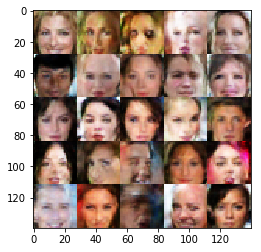

Iter 11111... Discriminator Loss: 1.0754... Generator Loss: 0.6873
Iter 11121... Discriminator Loss: 1.2780... Generator Loss: 0.8519
Iter 11131... Discriminator Loss: 0.8127... Generator Loss: 1.9372
Iter 11141... Discriminator Loss: 0.6552... Generator Loss: 1.5668
Iter 11151... Discriminator Loss: 0.9028... Generator Loss: 1.3104
Iter 11161... Discriminator Loss: 1.4763... Generator Loss: 0.5510
Iter 11171... Discriminator Loss: 0.9209... Generator Loss: 1.7437
Iter 11181... Discriminator Loss: 0.6525... Generator Loss: 1.8979
Iter 11191... Discriminator Loss: 0.6859... Generator Loss: 1.2572
Iter 11201... Discriminator Loss: 0.6400... Generator Loss: 1.9193


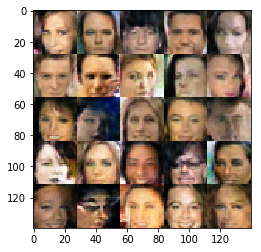

Iter 11211... Discriminator Loss: 0.6912... Generator Loss: 1.7894
Iter 11221... Discriminator Loss: 0.5949... Generator Loss: 3.0778
Iter 11231... Discriminator Loss: 0.8145... Generator Loss: 1.2219
Iter 11241... Discriminator Loss: 0.5768... Generator Loss: 1.9342
Iter 11251... Discriminator Loss: 1.7572... Generator Loss: 0.6003
Iter 11261... Discriminator Loss: 1.0332... Generator Loss: 1.4332
Iter 11271... Discriminator Loss: 1.4554... Generator Loss: 0.8567
Iter 11281... Discriminator Loss: 0.9459... Generator Loss: 1.2246
Iter 11291... Discriminator Loss: 1.1188... Generator Loss: 1.6123
Iter 11301... Discriminator Loss: 0.6848... Generator Loss: 1.1098


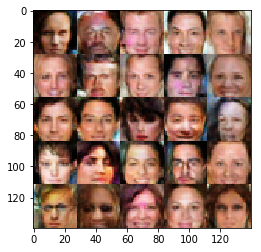

Iter 11311... Discriminator Loss: 0.6430... Generator Loss: 1.4346
Iter 11321... Discriminator Loss: 0.8869... Generator Loss: 2.6121
Iter 11331... Discriminator Loss: 0.8081... Generator Loss: 1.8090
Iter 11341... Discriminator Loss: 1.3755... Generator Loss: 0.5392
Iter 11351... Discriminator Loss: 0.5429... Generator Loss: 2.2428
Iter 11361... Discriminator Loss: 0.5878... Generator Loss: 1.8430
Iter 11371... Discriminator Loss: 1.2177... Generator Loss: 0.6610
Iter 11381... Discriminator Loss: 1.3458... Generator Loss: 0.6767
Iter 11391... Discriminator Loss: 1.2292... Generator Loss: 0.9168
Iter 11401... Discriminator Loss: 0.8937... Generator Loss: 1.2336


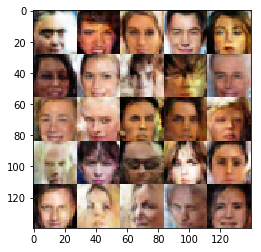

Iter 11411... Discriminator Loss: 0.4579... Generator Loss: 3.0243
Iter 11421... Discriminator Loss: 1.5559... Generator Loss: 0.5447
Iter 11431... Discriminator Loss: 0.6965... Generator Loss: 2.0098
Iter 11441... Discriminator Loss: 0.6713... Generator Loss: 1.4520
Iter 11451... Discriminator Loss: 1.2300... Generator Loss: 0.9237
Iter 11461... Discriminator Loss: 0.8727... Generator Loss: 1.6463
Iter 11471... Discriminator Loss: 0.7012... Generator Loss: 3.1350
Iter 11481... Discriminator Loss: 0.7387... Generator Loss: 2.1919
Iter 11491... Discriminator Loss: 0.7045... Generator Loss: 2.0977
Iter 11501... Discriminator Loss: 0.6376... Generator Loss: 2.5349


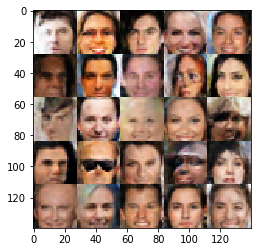

Iter 11511... Discriminator Loss: 0.7693... Generator Loss: 1.3998
Iter 11521... Discriminator Loss: 0.8585... Generator Loss: 1.5430
Iter 11531... Discriminator Loss: 0.7705... Generator Loss: 1.3225
Iter 11541... Discriminator Loss: 0.7977... Generator Loss: 1.6609
Iter 11551... Discriminator Loss: 1.8219... Generator Loss: 0.5678
Iter 11561... Discriminator Loss: 0.5451... Generator Loss: 2.5522
Iter 11571... Discriminator Loss: 1.2560... Generator Loss: 0.9497
Iter 11581... Discriminator Loss: 0.7140... Generator Loss: 0.9965
Iter 11591... Discriminator Loss: 0.7456... Generator Loss: 1.5200
Iter 11601... Discriminator Loss: 0.5939... Generator Loss: 2.7020


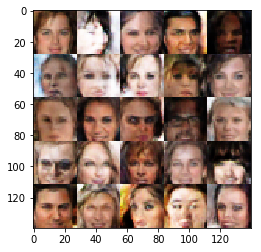

Iter 11611... Discriminator Loss: 0.8179... Generator Loss: 1.4835
Iter 11621... Discriminator Loss: 1.4316... Generator Loss: 0.7947
Iter 11631... Discriminator Loss: 0.8122... Generator Loss: 1.0892
Iter 11641... Discriminator Loss: 1.2967... Generator Loss: 0.7458
Iter 11651... Discriminator Loss: 1.0680... Generator Loss: 0.9522
Iter 11661... Discriminator Loss: 0.5926... Generator Loss: 2.9177
Iter 11671... Discriminator Loss: 0.9072... Generator Loss: 1.7530
Iter 11681... Discriminator Loss: 0.9459... Generator Loss: 1.4651
Iter 11691... Discriminator Loss: 1.0692... Generator Loss: 1.5944
Iter 11701... Discriminator Loss: 1.4872... Generator Loss: 0.4083


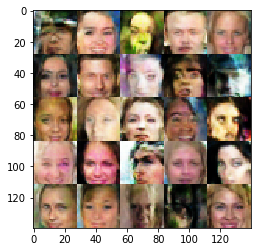

Iter 11711... Discriminator Loss: 0.6142... Generator Loss: 2.1761
Iter 11721... Discriminator Loss: 0.6768... Generator Loss: 1.9945
Iter 11731... Discriminator Loss: 0.6840... Generator Loss: 1.5825
Iter 11741... Discriminator Loss: 1.1837... Generator Loss: 0.9246
Iter 11751... Discriminator Loss: 0.9244... Generator Loss: 0.7712
Iter 11761... Discriminator Loss: 0.7169... Generator Loss: 1.7716
Iter 11771... Discriminator Loss: 0.9300... Generator Loss: 1.2137
Iter 11781... Discriminator Loss: 1.1993... Generator Loss: 0.7909
Iter 11791... Discriminator Loss: 1.4049... Generator Loss: 0.7000
Iter 11801... Discriminator Loss: 0.7698... Generator Loss: 1.8640


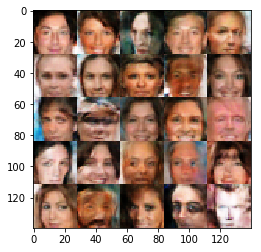

Iter 11811... Discriminator Loss: 0.8118... Generator Loss: 1.1957
Iter 11821... Discriminator Loss: 1.3117... Generator Loss: 0.7059
Iter 11831... Discriminator Loss: 0.8567... Generator Loss: 1.4441
Iter 11841... Discriminator Loss: 1.6417... Generator Loss: 0.5844
Iter 11851... Discriminator Loss: 0.9977... Generator Loss: 1.3839
Iter 11861... Discriminator Loss: 0.7391... Generator Loss: 1.9708
Iter 11871... Discriminator Loss: 0.9172... Generator Loss: 1.7299
Iter 11881... Discriminator Loss: 0.9383... Generator Loss: 1.2873
Iter 11891... Discriminator Loss: 0.8127... Generator Loss: 3.4268
Iter 11901... Discriminator Loss: 0.6559... Generator Loss: 1.7165


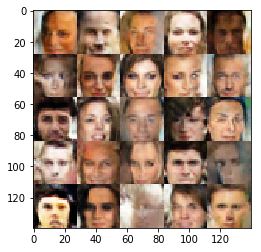

Iter 11911... Discriminator Loss: 0.7146... Generator Loss: 1.4029
Iter 11921... Discriminator Loss: 0.7677... Generator Loss: 1.7159
Iter 11931... Discriminator Loss: 0.9521... Generator Loss: 0.9781
Iter 11941... Discriminator Loss: 1.2046... Generator Loss: 0.9781
Iter 11951... Discriminator Loss: 1.0468... Generator Loss: 1.1868
Iter 11961... Discriminator Loss: 0.7236... Generator Loss: 1.5291
Iter 11971... Discriminator Loss: 1.4790... Generator Loss: 0.7305
Iter 11981... Discriminator Loss: 0.9098... Generator Loss: 1.0450
Iter 11991... Discriminator Loss: 0.6362... Generator Loss: 2.1153
Iter 12001... Discriminator Loss: 0.6105... Generator Loss: 3.0872


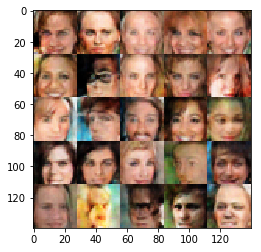

Iter 12011... Discriminator Loss: 0.6392... Generator Loss: 1.4488
Iter 12021... Discriminator Loss: 0.9116... Generator Loss: 1.0208
Iter 12031... Discriminator Loss: 0.9963... Generator Loss: 1.0856
Iter 12041... Discriminator Loss: 0.8144... Generator Loss: 1.4146
Iter 12051... Discriminator Loss: 0.6954... Generator Loss: 2.1829
Iter 12061... Discriminator Loss: 0.9909... Generator Loss: 1.7808
Iter 12071... Discriminator Loss: 0.7798... Generator Loss: 1.9564
Iter 12081... Discriminator Loss: 0.7945... Generator Loss: 1.9674
Iter 12091... Discriminator Loss: 0.6644... Generator Loss: 2.6686
Iter 12101... Discriminator Loss: 0.8504... Generator Loss: 2.3350


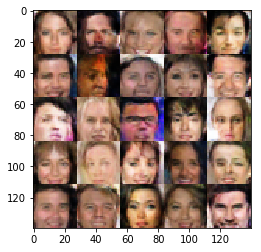

Iter 12111... Discriminator Loss: 0.9371... Generator Loss: 1.4717
Iter 12121... Discriminator Loss: 1.3413... Generator Loss: 0.8706
Iter 12131... Discriminator Loss: 2.2383... Generator Loss: 0.4789
Iter 12141... Discriminator Loss: 0.9070... Generator Loss: 1.0661
Iter 12151... Discriminator Loss: 0.8605... Generator Loss: 0.9940
Iter 12161... Discriminator Loss: 0.7092... Generator Loss: 1.1082
Iter 12171... Discriminator Loss: 0.5193... Generator Loss: 2.2521
Iter 12181... Discriminator Loss: 0.4814... Generator Loss: 2.6554
Iter 12191... Discriminator Loss: 1.1527... Generator Loss: 0.9311
Iter 12201... Discriminator Loss: 1.6750... Generator Loss: 0.4922


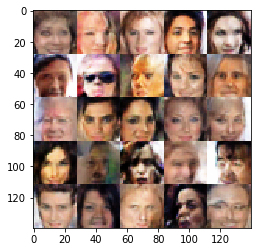

Iter 12211... Discriminator Loss: 1.2415... Generator Loss: 0.8664
Iter 12221... Discriminator Loss: 0.9263... Generator Loss: 1.6558
Iter 12231... Discriminator Loss: 1.1109... Generator Loss: 0.7650
Iter 12241... Discriminator Loss: 0.6979... Generator Loss: 2.1184
Iter 12251... Discriminator Loss: 0.8804... Generator Loss: 1.6133
Iter 12261... Discriminator Loss: 0.5085... Generator Loss: 1.9086
Iter 12271... Discriminator Loss: 0.7715... Generator Loss: 2.2000
Iter 12281... Discriminator Loss: 1.8375... Generator Loss: 0.8536
Iter 12291... Discriminator Loss: 1.2415... Generator Loss: 0.8667
Iter 12301... Discriminator Loss: 1.0268... Generator Loss: 0.9675


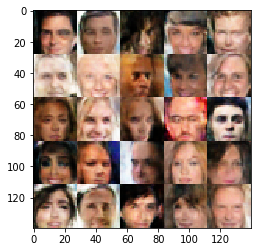

Iter 12311... Discriminator Loss: 0.9833... Generator Loss: 1.2381
Iter 12321... Discriminator Loss: 1.0348... Generator Loss: 2.1905
Iter 12331... Discriminator Loss: 1.0188... Generator Loss: 0.5929
Iter 12341... Discriminator Loss: 0.9908... Generator Loss: 1.3149
Iter 12351... Discriminator Loss: 0.6120... Generator Loss: 1.7271
Iter 12361... Discriminator Loss: 0.8197... Generator Loss: 1.6659
Iter 12371... Discriminator Loss: 1.0930... Generator Loss: 1.1727
Iter 12381... Discriminator Loss: 0.7391... Generator Loss: 1.2975
Iter 12391... Discriminator Loss: 0.6785... Generator Loss: 1.1650
Iter 12401... Discriminator Loss: 0.6496... Generator Loss: 3.0010


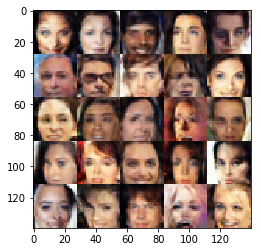

Iter 12411... Discriminator Loss: 1.0122... Generator Loss: 1.0118
Iter 12421... Discriminator Loss: 0.5659... Generator Loss: 1.9565
Iter 12431... Discriminator Loss: 0.6767... Generator Loss: 1.5498
Iter 12441... Discriminator Loss: 0.6637... Generator Loss: 1.9199
Iter 12451... Discriminator Loss: 1.0683... Generator Loss: 0.9442
Iter 12461... Discriminator Loss: 0.8909... Generator Loss: 3.0742
Iter 12471... Discriminator Loss: 0.7393... Generator Loss: 1.7655
Iter 12481... Discriminator Loss: 0.5753... Generator Loss: 2.1033
Iter 12491... Discriminator Loss: 1.2726... Generator Loss: 0.8471
Iter 12501... Discriminator Loss: 0.7900... Generator Loss: 1.4002


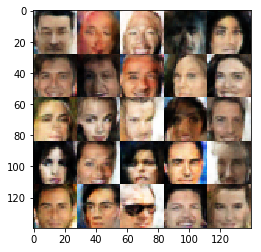

Iter 12511... Discriminator Loss: 0.7844... Generator Loss: 1.3216
Iter 12521... Discriminator Loss: 1.2187... Generator Loss: 0.6347
Iter 12531... Discriminator Loss: 0.8760... Generator Loss: 1.8540
Iter 12541... Discriminator Loss: 1.0320... Generator Loss: 2.4484
Iter 12551... Discriminator Loss: 0.8854... Generator Loss: 1.4885
Iter 12561... Discriminator Loss: 0.8178... Generator Loss: 3.0377
Iter 12571... Discriminator Loss: 0.8380... Generator Loss: 1.5739
Iter 12581... Discriminator Loss: 0.6900... Generator Loss: 1.8055
Iter 12591... Discriminator Loss: 0.6583... Generator Loss: 2.6615
Iter 12601... Discriminator Loss: 0.6441... Generator Loss: 2.9014


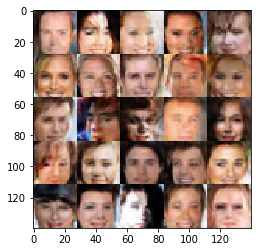

Iter 12611... Discriminator Loss: 0.5836... Generator Loss: 1.9798
Iter 12621... Discriminator Loss: 1.9124... Generator Loss: 4.5285
Iter 12631... Discriminator Loss: 0.8471... Generator Loss: 1.8836
Iter 12641... Discriminator Loss: 1.6082... Generator Loss: 0.9173
Iter 12651... Discriminator Loss: 0.8089... Generator Loss: 2.3144
Iter 12661... Discriminator Loss: 0.7006... Generator Loss: 1.9045


In [37]:
batch_size = 16
z_dim = 200
learning_rate = 0.0008
beta1 = 0.3

epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.